In [1]:
import pickle as pkl
import matplotlib.pyplot as plt
import numpy as np
import colour
import matplotlib
import seaborn as sns
import glob
from simulation.multilayer_thin_film import load_nk
D = ['TiO2', 'SiO2', 'MgF2', 'HfO2', 'Al2O3', 'ZnO', 'ZnS', 'ZnSe', 'Ta2O5', 'Fe2O3']
M = ['Ag', 'Al', 'Ni', "Ge", 'Ti', 'Zn', 'Cr', 'Cu', 'Au', 'W']
NK_DICT = load_nk(D + M)
matplotlib.rcParams['figure.dpi']=300
matplotlib.rcParams['font.size']= 12

# Figure 1

* data distribution

In [234]:
data = pkl.load(open('./simulation/multilayer_data/sRGB_400K/val.pkl', 'rb'))

In [235]:
xyY = np.array([colour.XYZ_to_xyY(colour.sRGB_to_XYZ(item / 255)) for item in data['target_RGB']])

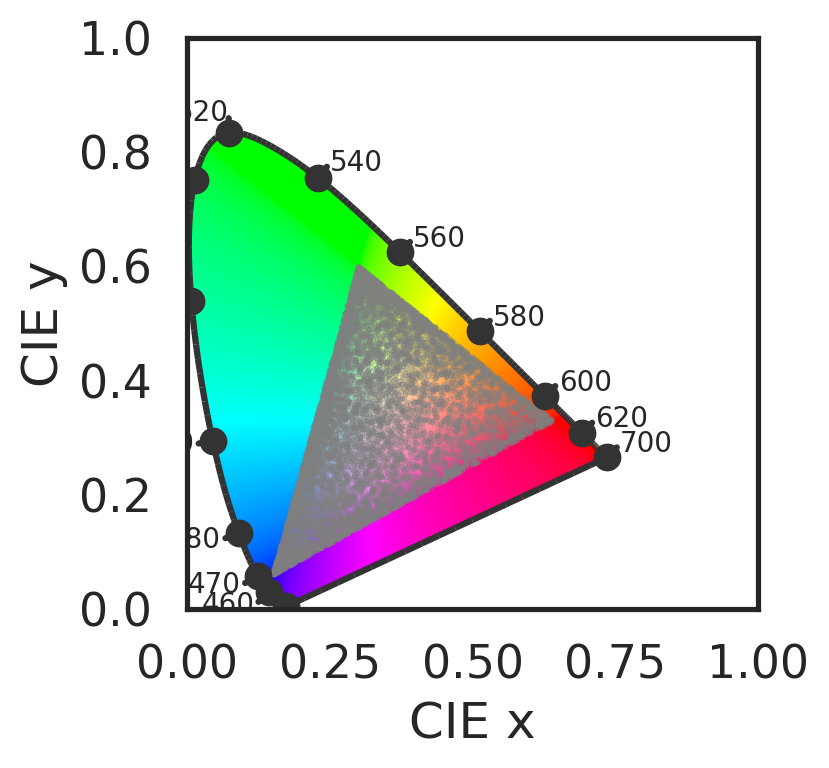

In [237]:
matplotlib.rcParams['font.size']= 12
fig, ax = plt.subplots()
ax.scatter(xyY[:, 0], xyY[:, 1], s=0.3, color='gray', alpha=0.4)
colour.plotting.plot_chromaticity_diagram_CIE1931(**{'axes':ax, 'title':None})
ax.plot([0.64, 0.3, 0.15, 0.64], [0.33, 0.6, 0.06, 0.33], color='black')
ax.scatter([0.64, 0.3, 0.15], [0.33, 0.6, 0.06], marker='*', color='white', s=100)
fig.savefig('./paper_figures/sRGB_val_CIExy.png', bbox_inches='tight')

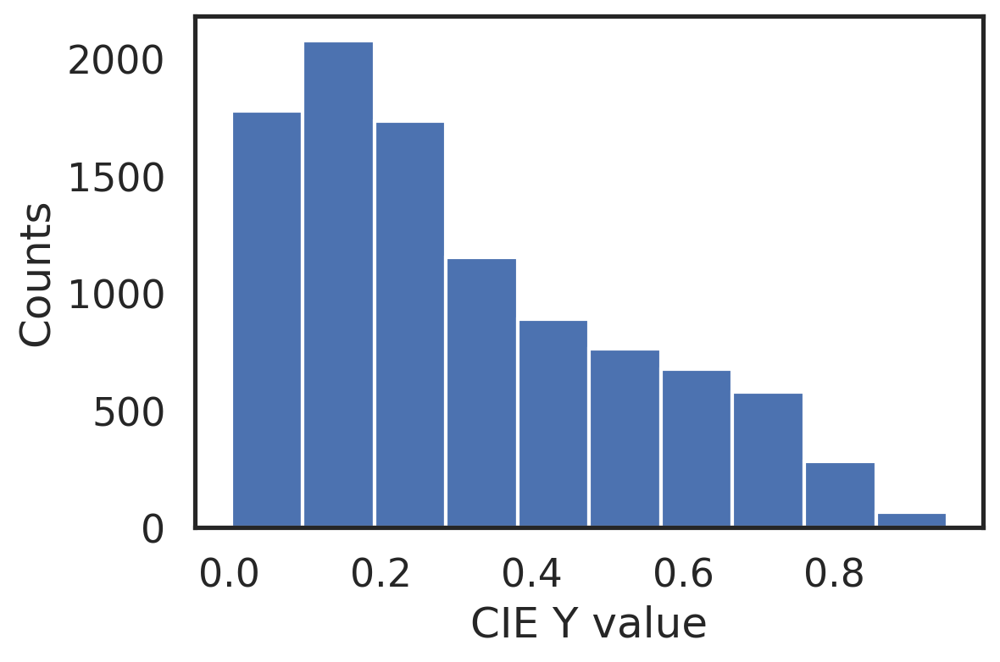

In [238]:
matplotlib.rcParams['font.size']= 14
fig, ax = plt.subplots()
ax.hist(xyY[:, 2])
ax.set_xlabel('CIE Y value')
ax.set_ylabel('Counts')
fig.savefig('./paper_figures/CIE_Y_dist.png', bbox_inches='tight')

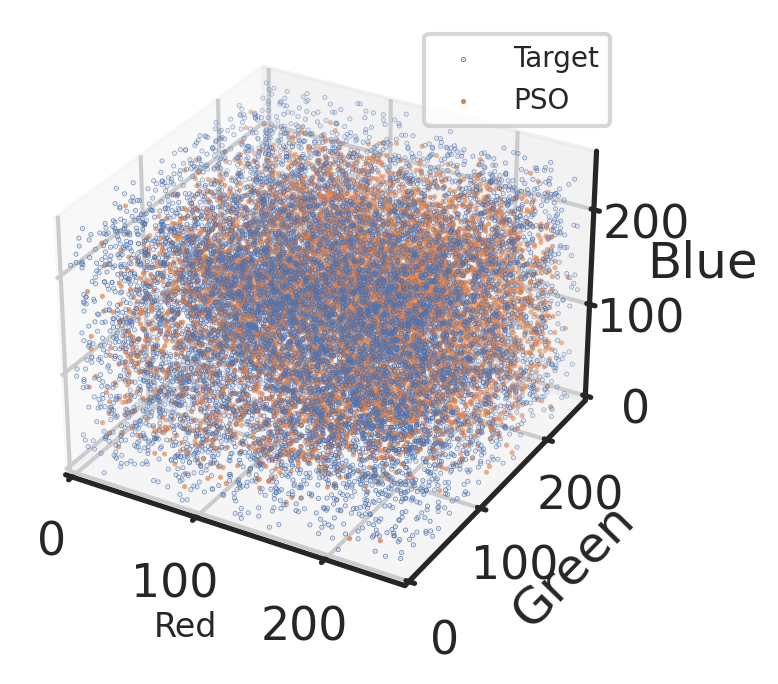

In [241]:
matplotlib.rcParams['font.size']= 10
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter(data['target_RGB'][:, 0], data['target_RGB'][:, 1], data['target_RGB'][:, 2], s=0.1, label='Target')

valid_idx = np.logical_and(data['designed_RGB'] >= 0, data['designed_RGB'] <= 255).sum(axis=1) == 3
ax.scatter(data['designed_RGB'][:, 0][valid_idx], data['designed_RGB'][:, 1][valid_idx], data['designed_RGB'][:, 2][valid_idx], s=0.1, label='PSO', marker='*')

ax.set_xlim([0, 255])
ax.set_ylim([0, 255])
ax.set_zlim([0, 255])
ax.set_xlabel('Red', fontsize=12)
ax.set_ylabel('Green')
ax.set_zlabel('Blue')
plt.legend(loc='upper right', fontsize=10)
fig.savefig('./paper_figures/val_RGB_dist.png', bbox_inches='tight')

In [244]:
deltaEs = [colour.difference.delta_E_CIE2000(lab, lab_) for lab, lab_ in zip(data['target_Lab'], data['designed_Lab'])]
np.mean(deltaEs)

6.2735245066919019

In [245]:
RGB, RGB_ = data['target_RGB'][valid_idx], data['designed_RGB'][valid_idx]

In [273]:

(RGB_ - RGB).mean(axis=0)

array([ 12.76253243,   7.69870805,  10.35148976])

Text(0, 0.5, 'PSO Error')

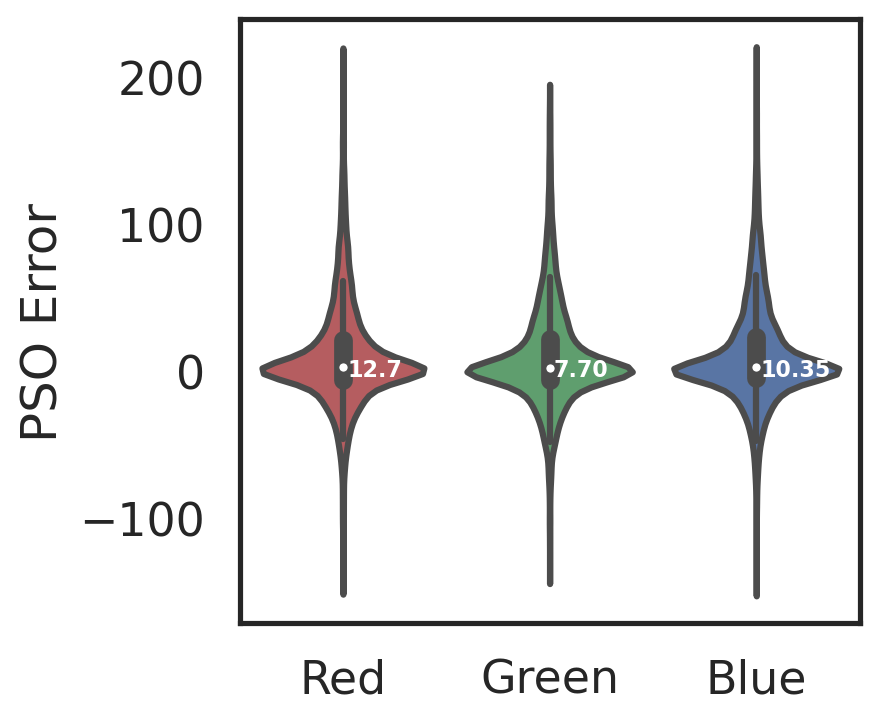

In [277]:
fig, ax = plt.subplots(figsize=(4, 4))
diff_data = {'val':(RGB_-RGB).reshape(-1), 'idx':np.repeat(['Red', 'Green', 'Blue'], len(RGB))}
my_pal = {"Red": "r", "Green": "g", "Blue":"b"}
sns.violinplot(data=diff_data, x='idx', y='val', palette=my_pal, ax=ax)
plt.text(x = 0.02, y=-3, s = '12.7', fontsize=8, weight='bold', color='white')
plt.text(x = 1.02, y=-3, s = '7.70', fontsize=8, weight='bold', color='white')
plt.text(x = 2.02, y=-3, s = '10.35', fontsize=8, weight='bold', color='white')
plt.ylabel('PSO Error')
# plt.savefig('./paper_figures/RGB_PSO_target_difference.png', bbox_inches='tight')

# Figure 2

* Gaussian Mixture Density Profile Illustration
* AUC
* Delta E

In [2]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

def gaussian(x, y, mu, sigma):
    
    return 1 / (2 * np.pi * sigma[0] * sigma[1]) * np.exp(-0.5 * (((x - mu[0]) / sigma[0]) ** 2 + ((y - mu[1]) / sigma[1]) ** 2))

<AxesSubplot:>

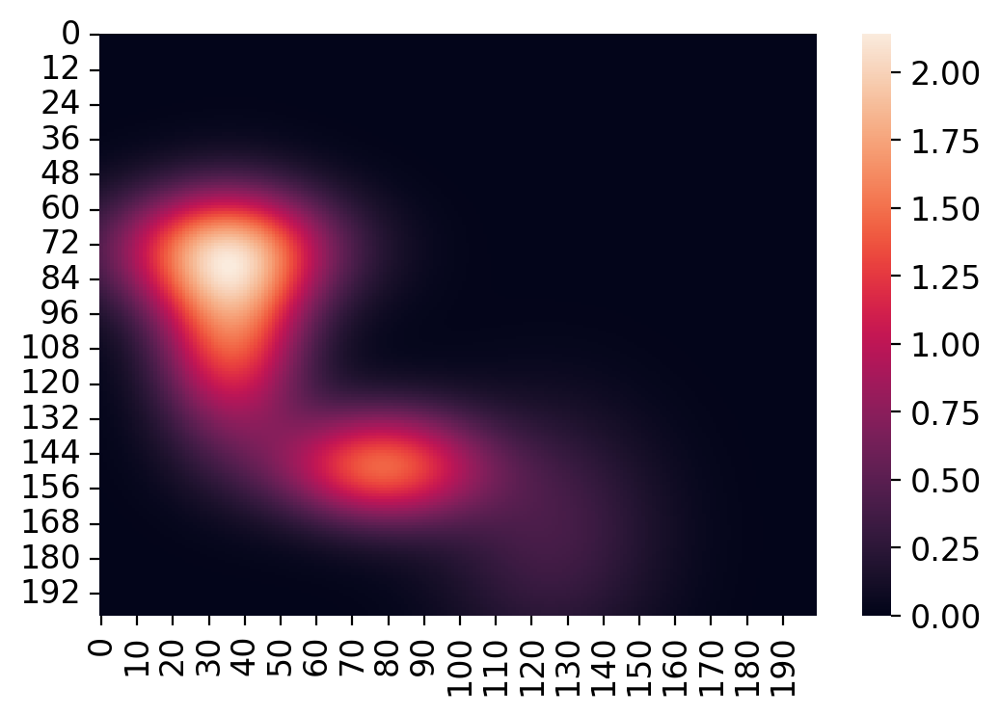

In [3]:
mean, sigma, weight = np.random.uniform(low=-0.8, high=.8, size=(5,2)), np.random.uniform(low=0.1, high=0.3, size=(5,2)), [0.15, 0.3, 0.3, 0.1, 0.15]
xx, yy = np.meshgrid(np.arange(-1, 1, 0.01), np.arange(-1, 1 ,0.01))
ps = [weight[i] * gaussian(xx, yy, mean[i], sigma[i]) for i in range(5)]
sns.heatmap(sum(ps))

/tmp/ipykernel_2082530/1895997432.py:2: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


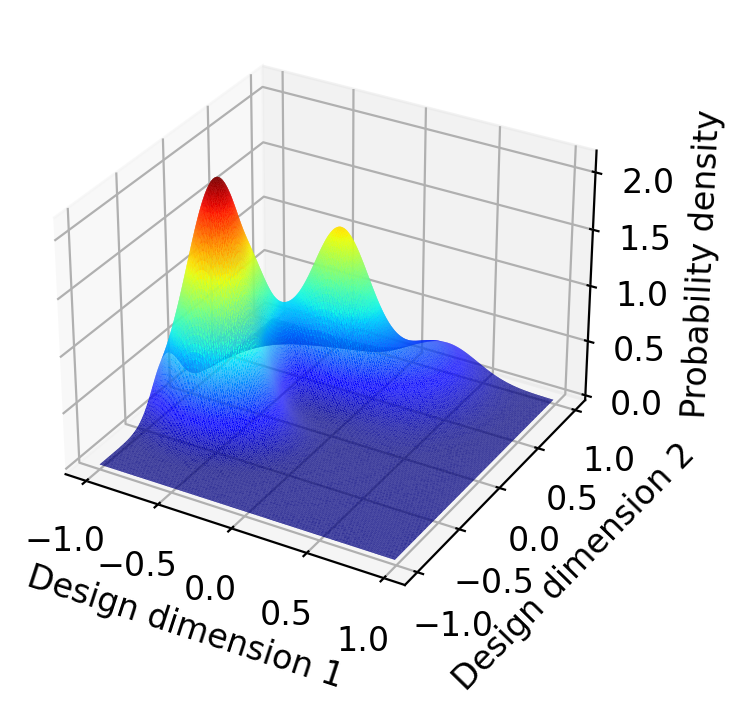

In [4]:
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_trisurf(xx.reshape(-1), yy.reshape(-1), sum(ps).reshape(-1), cmap=plt.cm.jet, linewidth=0.2)
ax.set_xlabel('Design dimension 1')
ax.set_ylabel('Design dimension 2')
ax.set_zlabel('Probability density')
# fig.savefig('./paper_figures/gmm.png')
plt.show()

In [106]:
from multitask_training import MultitaskDataset, MultitaskMDN
import json
from torch.distributions.categorical import Categorical
import torch.nn as nn
from torch.distributions import Normal, OneHotCategorical, MixtureSameFamily, Independent
import torch
import tqdm
import os

In [90]:
datapath = '/data/hzwang/Projects/meta-learning-photonics-design/simulation/multilayer_data/sRGB_400K'
dataset = MultitaskDataset(datapath)

device = 7

model_path = glob.glob('./logs/1202_nmixtures_400K/nmix51200_400K/lightning_logs/version_0/checkpoints/*.ckpt')[0]
f = open('./logs/1202_nmixtures_400K/nmix51200_400K/hparams.json')
data = json.load(f)
f.close()
model = MultitaskMDN.load_from_checkpoint(model_path, lr=data['lr'], hidden_dim=data['hidden_dim'], n_mixtures=data['n_mixtures'], train_ratio=data['train_ratio'], alpha=data['alpha'], seed=data['seed'], weight_decay=data['weight_decay'])
# model = MultitaskMDN(lr=data['lr'], hidden_dim=data['hidden_dim'], n_mixtures=data['n_mixtures'], train_ratio=data['train_ratio'], alpha=data['alpha'], seed=data['seed'], weight_decay=data['weight_decay'])
model = model.to(device)

In [107]:
data = pkl.load(open(os.path.join(datapath, 'test.pkl'), 'rb'))

In [110]:
data['mats'][2]

array(['SiO2', 'Ag', 'Cu', 'HfO2', 'Ni', 'SiO2', 'Ag', 'Cu', 'HfO2', 'Ni'],
      dtype='<U5')

In [98]:
x, rgb, rgb_designed, y, _, _, _ = dataset[2]
x = x.view(1, -1).to(device)
rgb = rgb.view(1, -1).to(device)
rgb_designed = rgb_designed.view(1, -1).to(device)
y = y.view(1, -1).to(device)

print(dataset.rgb_scaler.inverse_transform(rgb_designed.cpu().numpy()).astype(int))

[[ 26 123 130]]


In [99]:
means, stds, weights, _ = model.mdn(x, rgb, rgb_designed, _)

In [100]:
batch_size = 1
comp = Independent(Normal(means.view(batch_size, 51200, -1), stds.view(batch_size, 51200, -1)), 1)
mix = Categorical(logits = weights)
gmm = MixtureSameFamily(mix, comp)
likelihood = gmm.log_prob(y)

In [101]:
yy = torch.linspace(-1, 1, 100).to(device)
grid_x, grid_y = torch.meshgrid(yy, yy)
zz = torch.zeros_like(grid_x).reshape(-1, 1)
y_space = torch.hstack((grid_x.reshape(-1, 1) * 122.5 + 127.5, grid_y.reshape(-1, 1) * 5 + 10 , zz + 10, zz + 125, zz + 100)).cpu().numpy()

In [102]:
grid_xx, grid_yy = grid_x.reshape(-1, 1) * 122.5 + 127.5, grid_y.reshape(-1, 1) * 5 + 10

In [103]:
y_space = torch.tensor(dataset.thickness_scaler.transform(y_space))[:, :4].to(device)

  0%|          | 0/10000 [00:00<?, ?it/s]

/tmp/ipykernel_3334746/201537397.py:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


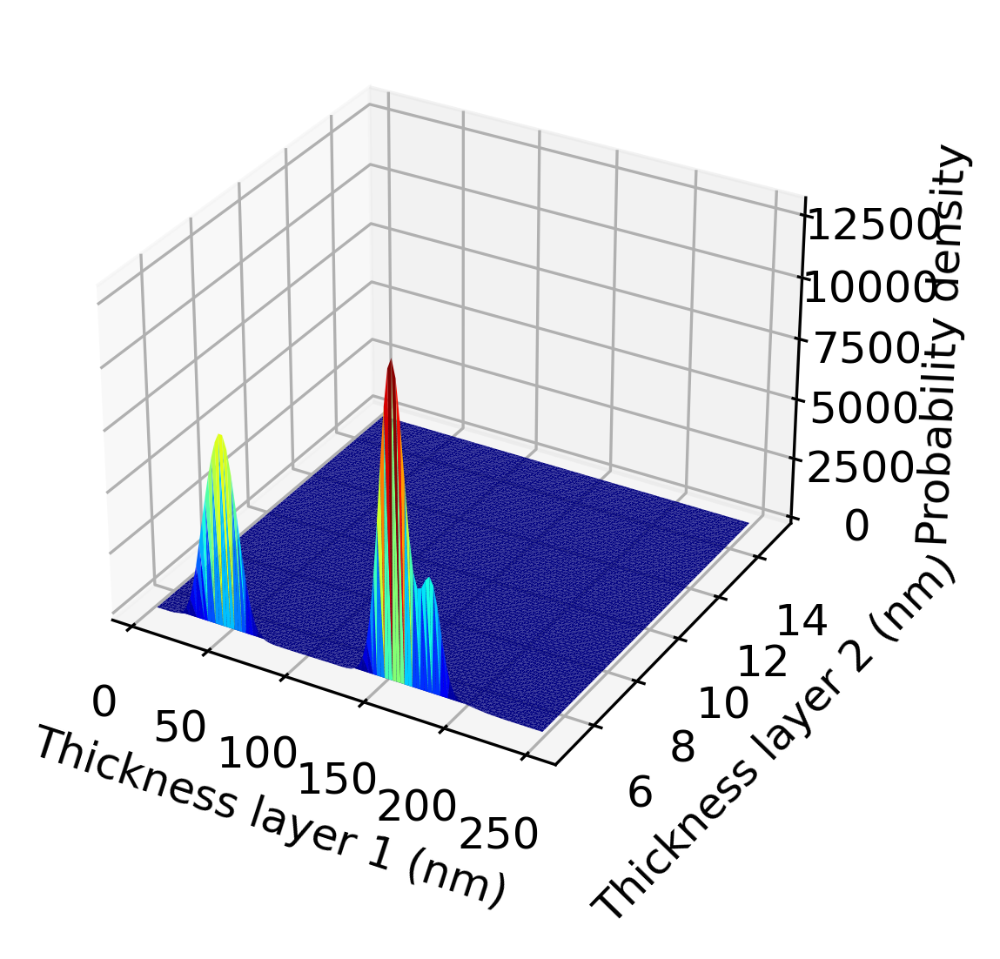

In [104]:
probs = []
for i in tqdm.notebook.tqdm(range(10000)):
    prob = torch.exp(gmm.log_prob(y_space[i])).detach().cpu().item()
    probs.append(prob)

fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_trisurf(grid_xx.reshape(-1).cpu().numpy(), grid_yy.reshape(-1).cpu().numpy(), probs, cmap=plt.cm.jet, linewidth=0.2)
ax.set_xlabel('Thickness layer 1 (nm)')
ax.set_ylabel('Thickness layer 2 (nm)')
ax.set_zlabel('Probability density')
# fig.savefig('./paper_figures/gmm.png')
plt.show()

In [111]:
### Weights of learned mixtures

In [175]:
weights_cum = np.zeros((1, 51200))

for i in tqdm.notebook.tqdm(range(10000)):
    x, rgb, rgb_designed, y, _, _, _ = dataset[i]
    x = x.view(1, -1).to(device)
    rgb = rgb.view(1, -1).to(device)
    rgb_designed = rgb_designed.view(1, -1).to(device)
    y = y.view(1, -1).to(device)

    means, stds, weights, _ = model.mdn(x, rgb, rgb_designed, _)
    weights = torch.softmax(weights, dim=1).detach().cpu().numpy()
    weights_cum += weights
weights_cum = weights_cum / 10000

  0%|          | 0/10000 [00:00<?, ?it/s]

Text(0.5, 0, '$i$th Gassuian component')

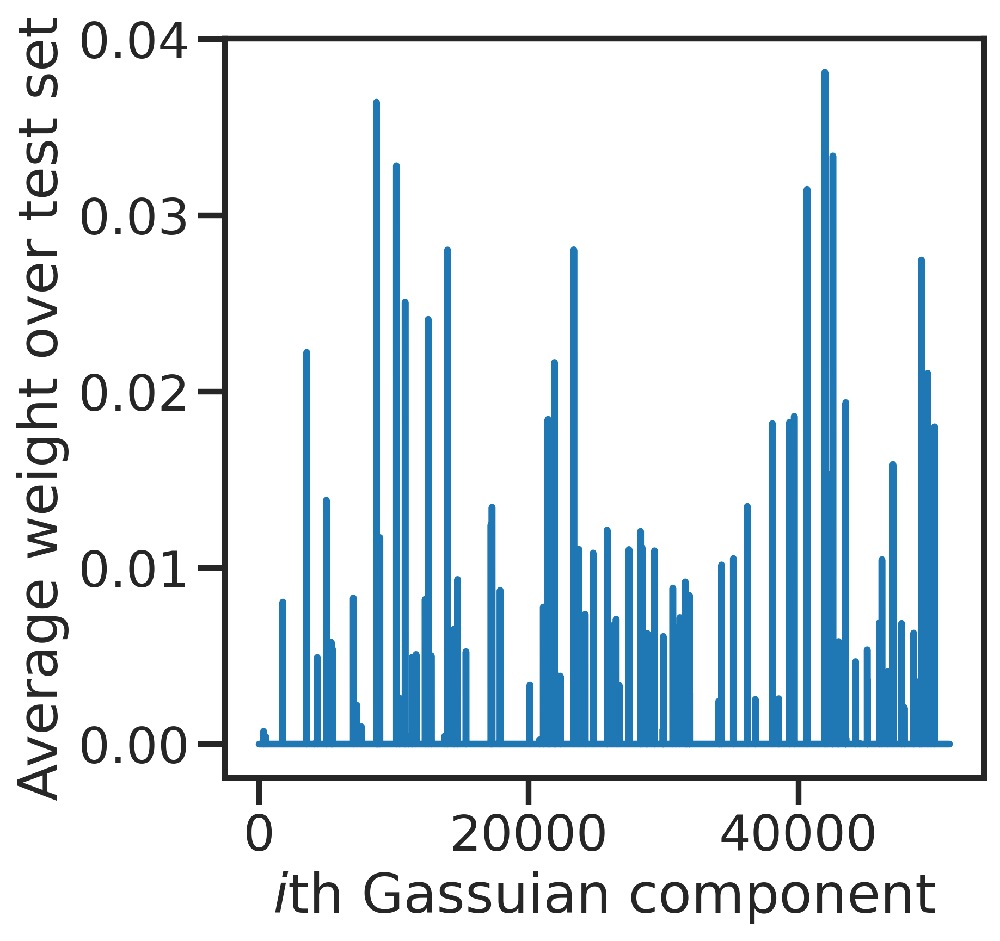

In [176]:

fig, ax = plt.subplots(figsize=(6, 6))
ax.plot(weights_cum.reshape(-1))
ax.set_ylabel('Average weight over test set')
ax.set_xlabel(r'$i$th Gassuian component')

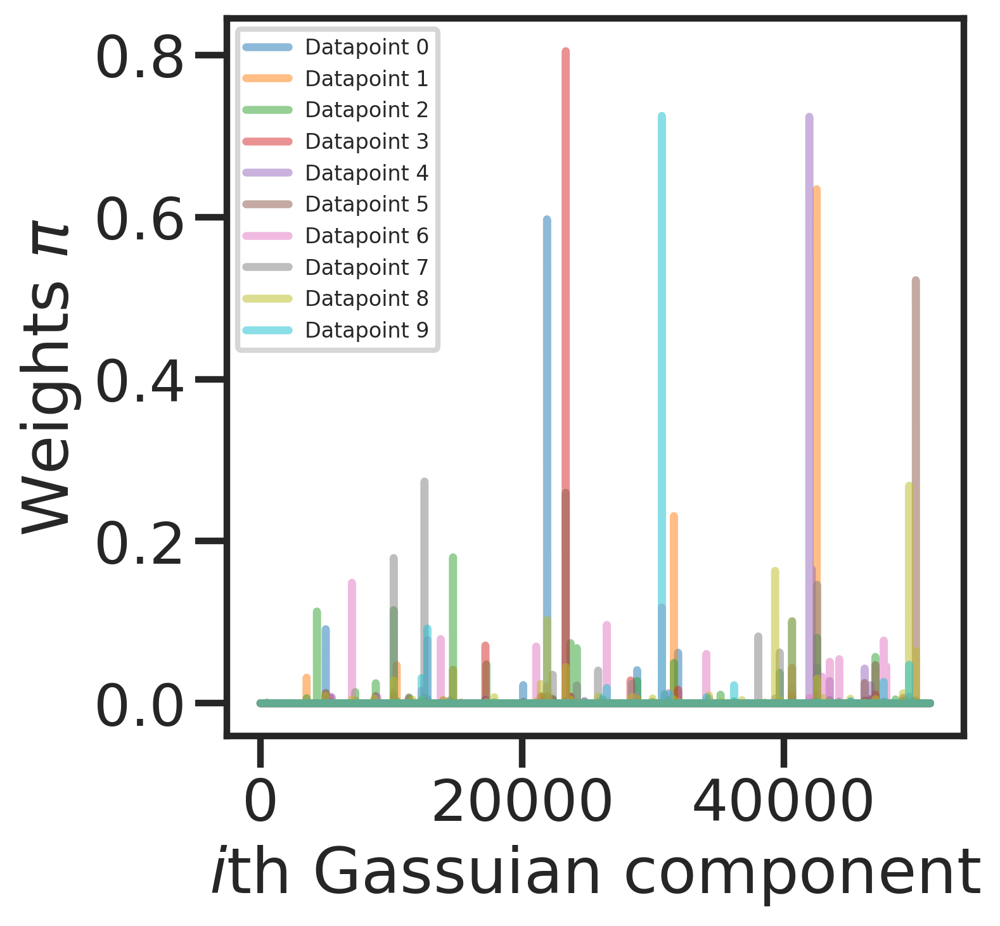

In [169]:
sns.set_style('ticks')
sns.set_context('poster')
fig, ax = plt.subplots(figsize = (5, 5))

for i in range(10):
    weights_cum = np.zeros((1, 51200))
    x, rgb, rgb_designed, y, _, _, _ = dataset[i]
    x = x.view(1, -1).to(device)
    rgb = rgb.view(1, -1).to(device)
    rgb_designed = rgb_designed.view(1, -1).to(device)
    y = y.view(1, -1).to(device)
    means, stds, weights, _ = model.mdn(x, rgb, rgb_designed, _)
    weights = torch.softmax(weights, dim=1).detach().cpu().numpy()
    weights_cum += weights
    ax.plot(weights_cum.reshape(-1), label=f'Datapoint {i}', alpha=0.5)
    ax.set_ylabel(r'Weights $\pi$')
    ax.set_xlabel(r'$i$th Gassuian component')
plt.legend(fontsize=8, loc='upper left')

## 2.2 AUC Curve

In [2]:
from multitask_training import MultitaskDataset, MultitaskMDN
import glob
import torch
from sklearn import metrics as sk_metrics
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from simulation.multilayer_thin_film import load_nk
from pyDOE import lhs
import itertools
from tqdm.notebook import tqdm

import pickle as pkl
from PIL import Image
from multiprocessing import Pool
import json

from colour.difference import delta_E, delta_E_CIE2000
from tmm import coh_tmm, inc_tmm
from colour import SDS_ILLUMINANTS, SpectralDistribution
from colour.colorimetry import MSDS_CMFS
from multiprocessing import Pool
illuminant = SDS_ILLUMINANTS['D65']
cmfs = MSDS_CMFS['CIE 1931 2 Degree Standard Observer']
pi = np.pi

def get_color(nk_dict, thickness):
    
    R = []
    wavelengths = np.arange(0.4, 0.701, 0.01)

    thickness = list(thickness)
    for i, lambda_vac in enumerate(wavelengths * 1e3):

        n_list = [1] + [val[i] for key, val in nk_dict.items()] + [1.5, 1]   

        inc_list = ['i', 'c', 'c', 'c', 'c', 'i', 'i', 'i']

        res = inc_tmm('s', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

        res_t = inc_tmm('p', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)
        
        R.append((res['R'] + res_t['R']) / 2)

    data = dict(zip((1e3 * wavelengths).astype('int'), R))
    sd = SpectralDistribution(data)

    XYZ  = colour.sd_to_XYZ(sd, cmfs, illuminant)
    RGB = colour.XYZ_to_sRGB(XYZ / 100)
    Lab = colour.XYZ_to_Lab(XYZ / 100)
    xyY = colour.XYZ_to_xyY(XYZ / 100)

    return XYZ, xyY, RGB, Lab

datapath = '/data/hzwang/Projects/meta-learning-photonics-design/simulation/multilayer_data/sRGB_400K'
dataset = MultitaskDataset(datapath)

device = 2

model_path = glob.glob('./logs/1202_nmixtures_400K/nmix51200_400K/lightning_logs/version_0/checkpoints/*.ckpt')[0]
f = open('./logs/1202_nmixtures_400K/nmix51200_400K/hparams.json')
data = json.load(f)
f.close()
model = MultitaskMDN.load_from_checkpoint(model_path, lr=data['lr'], hidden_dim=data['hidden_dim'], n_mixtures=data['n_mixtures'], train_ratio=data['train_ratio'], alpha=data['alpha'], seed=data['seed'], weight_decay=data['weight_decay'])
model = model.to(device)

In [4]:
test_loader = model.test_dataloader()

probs_list = []
labels_list = []

with torch.no_grad():
    for nk, rgb, designed_rgb, thickness, labels, _, _ in test_loader:
        nk, rgb, designed_rgb, thickness, labels = nk.to(device), rgb.to(device), designed_rgb.to(device), thickness.to(device), labels.to(device)
        out = list(model.forward(nk, rgb, designed_rgb, labels))
        prob = torch.sigmoid(out[-1]).detach().cpu().numpy()
        means, stds, weights = out[0], out[1], out[2]

        probs_list.append(prob)
        labels_list.append(labels.cpu().numpy())
    
labels, probs = np.concatenate(labels_list), np.concatenate(probs_list)
fpr, tpr, _ = sk_metrics.roc_curve(labels, probs)
auc = sk_metrics.auc(fpr, tpr)

# sns.set_style('white')

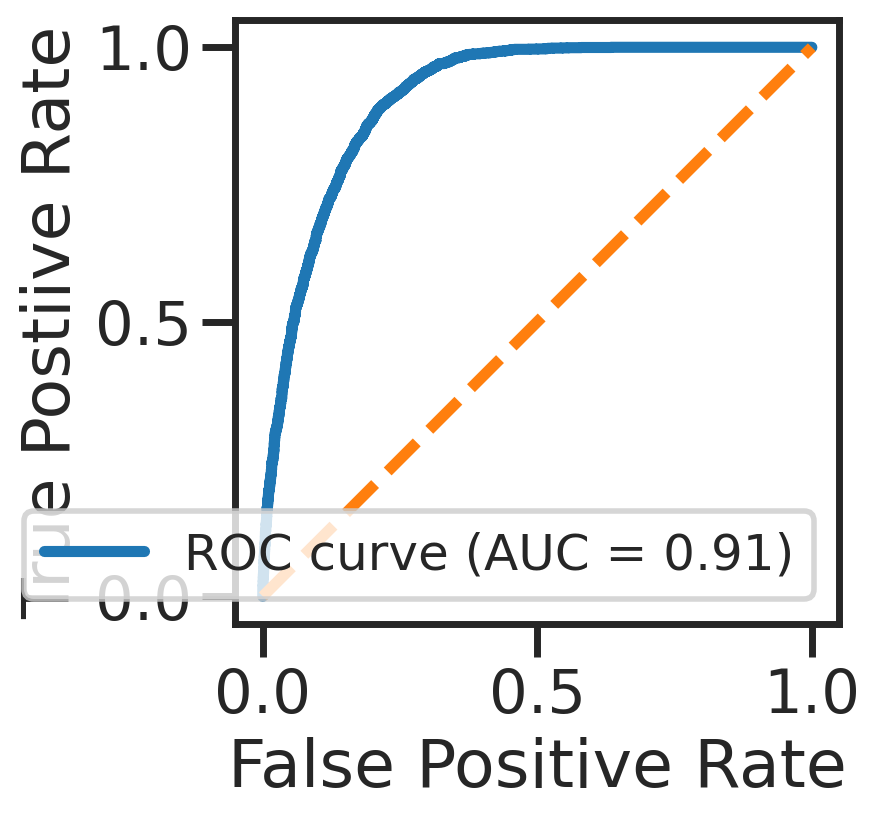

In [5]:
# sns.set_context('paper')
sns.set_style('ticks')
sns.set_context('poster')
# plt.style.use('classic')
fig, ax = plt.subplots()
ax.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})', linewidth=4)
ax.plot([0, 1], [0, 1], '--', linewidth=4)
ax.axis('square')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Postiive Rate')
ax.legend(loc='lower right', fontsize=18)
plt.show()
# ax.tick_params(length=6, width=2, colors='k', grid_color='k', grid_alpha=0.5, tickdir='in', rotation=0)
# plt.show()

## 2.3 Delta E performance

In [174]:
thick_designed_list = []
thick_target_list = []
target_lab_list = []
designed_lab_list = []
nk_list = []

test_loader = model.test_dataloader()

for nk, rgb, designed_rgb, thickness, labels, target_lab, designed_lab in test_loader:
    nk, rgb, designed_rgb, thickness, labels = nk.to(device), rgb.to(device), designed_rgb.to(device), thickness.to(device), labels.to(device)
    thick_designed = list(model.mdn.sample(nk, designed_rgb))[0].detach().cpu().numpy()
    thick_target = list(model.mdn.sample(nk, rgb))[0].detach().cpu().numpy()
    thick_designed_list.append(thick_designed)
    thick_target_list.append(thick_target)
    target_lab_list.append(target_lab.detach().cpu().numpy())
    designed_lab_list.append(designed_lab.detach().cpu().numpy())
    nk_list.append(nk.detach().cpu().numpy())

thick_designed = np.vstack(thick_designed_list)
thick_target = np.vstack(thick_target_list)
target_lab = np.vstack(target_lab_list)
designed_lab = np.vstack(designed_lab_list)

thick_d = dataset.thickness_scaler.inverse_transform(np.hstack((thick_designed, np.zeros((len(thick_designed), 1))))).astype(int).tolist()
thick_t = dataset.thickness_scaler.inverse_transform(np.hstack((thick_target, np.zeros((len(thick_designed), 1))))).astype(int).tolist()

In [175]:
# get nk_dict
nk_dicts = []
nk = dataset.nk_scaler.inverse_transform(np.vstack(nk_list)).reshape(-1, 10, 31)
for i in range(len(nk)):
    nk_dict = {"m1": nk[i, 0] + nk[i, 1] * 1j,
               "m2": nk[i, 2] + nk[i, 3] * 1j,
               "m3": nk[i, 4] + nk[i, 5] * 1j,
               "m4": nk[i, 6] + nk[i, 7] * 1j,
               "m5": nk[i, 8] + nk[i, 9] * 1j,
               }
    nk_dicts.append(nk_dict)

In [176]:
def get_lab(nk_dict, thickness):
    # nk_dict, thickness = design
    R = []
    wavelengths = np.arange(0.4, 0.701, 0.01)

    thickness = list(thickness)
    for i, lambda_vac in enumerate(wavelengths * 1e3):

        n_list = [1] + [val[i] for key, val in nk_dict.items()] + [1.5, 1]   

        inc_list = ['i', 'c', 'c', 'c', 'c', 'i', 'i', 'i']

        res = inc_tmm('s', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

        res_t = inc_tmm('p', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

        R.append((res['R'] + res_t['R']) / 2)

    data = dict(zip((1e3 * wavelengths).astype('int'), R))
    sd = SpectralDistribution(data)

    XYZ  = colour.sd_to_XYZ(sd, cmfs, illuminant)
    Lab = colour.XYZ_to_Lab(XYZ / 100)

    return Lab

In [177]:
import time
pool = Pool(64)

In [178]:
start_time = time.time()
lab_pred = pool.starmap(get_lab, zip(nk_dicts, thick_d))
end_time = time.time()

In [179]:
deltaE_designed = [delta_E_CIE2000(lab1, lab2) for lab1, lab2 in zip(designed_lab, lab_pred)]
print(f'Lab evaluation time {end_time - start_time:.1f} sec, deltaE from designed {np.mean(deltaE_designed)}')

deltaE_target = [delta_E_CIE2000(lab1, lab2) for lab1, lab2 in zip(target_lab, lab_pred)]
print(f'Lab evaluation time {end_time - start_time:.1f} sec, deltaE from target {np.mean(deltaE_target)}')

Lab evaluation time 20.2 sec, deltaE from designed 10.508841645267461
Lab evaluation time 20.2 sec, deltaE from target 13.956697576847107


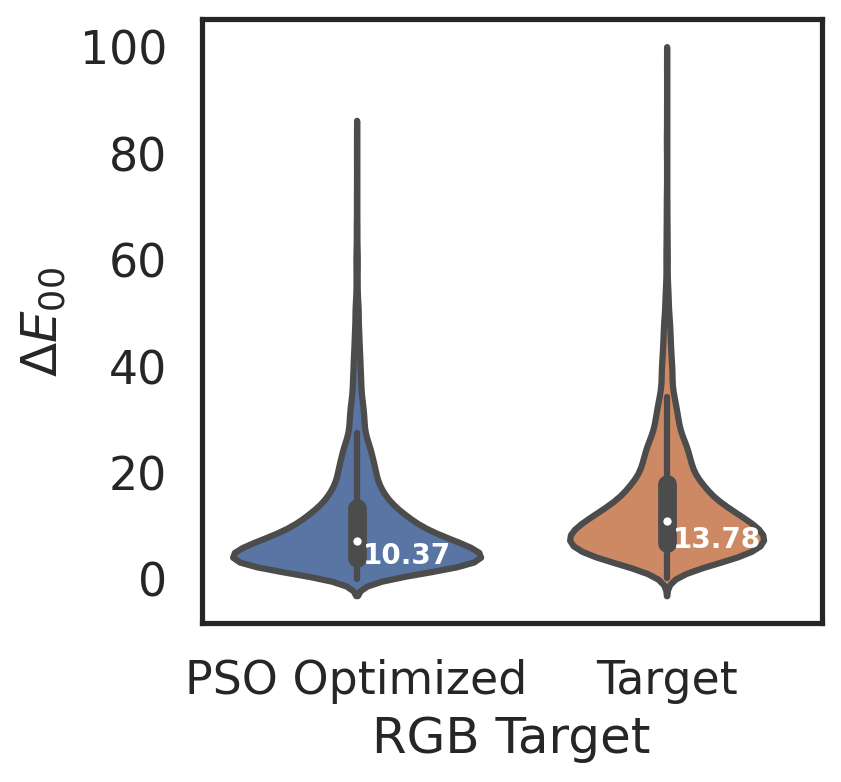

In [192]:
import pandas as pd
fig, ax = plt.subplots(figsize=(4, 4))
vals = np.concatenate((deltaE_designed, deltaE_target))
labels = ['PSO Optimized'] * 10000 +  ['Target'] * 10000
df = pd.DataFrame({'vals':vals, 'labels':labels})
sns.violinplot(data=df, x='labels', y='vals', ax=ax)
plt.text(x = 0.02, y=3, s = '10.37', fontsize=10, weight='bold', color='white')
plt.text(x = 1.02, y=6, s = '13.78', fontsize=10, weight='bold', color='white')
plt.ylabel(r'$\Delta E_{00}$')
plt.xlabel('RGB Target')
fig.savefig('./paper_figures/deltaE_performance.png', bbox_inches='tight')

# Figure 3 Chormium Design
* Designed colors
* Table of designed structures

In [6]:
D = ['TiO2', 'SiO2', 'MgF2', 'HfO2', 'Al2O3', 'ZnO', 'ZnS', 'ZnSe', 'Ta2O5', 'Fe2O3']
M = ['Ag', 'Al', 'Ni', "Ge", 'Ti', 'Zn', 'Cr', 'Cu', 'Au', 'W']
NK_DICT = load_nk(D + M)
nk_dict_cr = dict(zip(['m1', 'm2', 'm3', 'm4', 'm5'], [NK_DICT['Cr']] * 5))
_ , _, RGBs, Lab = get_color(nk_dict_cr, [20, 20, 20, 20, 20])

In [ ]:
D = ['TiO2', 'SiO2', 'MgF2', 'HfO2', 'Al2O3', 'ZnO', 'ZnS', 'ZnSe', 'Ta2O5', 'Fe2O3']
M = ['Ag', 'Al', 'Ni', "Ge", 'Ti', 'Zn', 'Cu', 'Au', 'W']

probs = []
designs = []
for mats in tqdm(itertools.product(D, M, M, D, M)):

    nk_dict = dict(zip(['m1', 'm2', 'm3', 'm4', 'm5'], [NK_DICT[mat] for mat in mats]))

    nk = dataset.nk_scaler.transform(np.tile(dataset.flatten_nk(nk_dict), (1, 1)))
    nk_input = torch.tensor(nk).float().to(device)

    RGB_input = torch.tensor(dataset.rgb_scaler.transform(RGBs[None, :])).float().to(device)
    out = list(model.forward(nk_input, RGB_input, RGB_input, RGB_input))
    prob = torch.sigmoid(out[-1]).detach().cpu().numpy()
    probs.append(prob)

In [198]:
D = ['TiO2', 'SiO2', 'MgF2', 'HfO2', 'Al2O3', 'ZnO', 'ZnS', 'ZnSe', 'Ta2O5', 'Fe2O3']
M = ['Ag', 'Al', 'Ni', "Ge", 'Ti', 'Zn', 'Cu', 'Au', 'W']
combs = np.array(list(itertools.product(D, M, M, D, M)))
# print(combs[np.argsort(np.array(probs).reshape(-1))[::-1][:100]])

sorted_res = sorted(list(zip(probs, itertools.product(D, M, M, D, M))))
mats_list = [item[1] for item in sorted_res[::-1][:100]]

In [509]:
mats_list = [('HfO2', 'W', 'Ge', 'SiO2', 'Zn'), ('HfO2', 'Zn', 'Ge', 'Al2O3', 'Ni'), ('SiO2', 'Ag', 'Ge', 'SiO2', 'Au'), ('HfO2', 'Zn', 'Ge', 'Al2O3', 'Au'), ('HfO2', 'Zn', 'Ge', 'MgF2', 'Au')]

In [537]:
deltaEs_mdn_only = []
best_designs_mdn_only = []
RGBs_mdn_only = []
for mats in mats_list:
    nk_dict = dict(zip(['m1', 'm2', 'm3', 'm4', 'm5'], [NK_DICT[mat] for mat in mats]))

    nk = dataset.nk_scaler.transform(np.tile(dataset.flatten_nk(nk_dict), (1, 1)))
    nk_input = torch.tensor(nk).float().to(device)

    RGB_input = torch.tensor(dataset.rgb_scaler.transform(255 * RGBs[None, :])).float().to(device)
    design, pred = model.mdn.sample(nk_input, RGB_input)
    design = design.detach().cpu().numpy()
    design = np.insert(design, 4, 0).reshape(-1, 5)

    design = np.ceil(dataset.thickness_scaler.inverse_transform(design)).astype(int)
    _, _, RGBs_designed, Lab_designed = get_color(nk_dict, design[0])
    deltaEs_mdn_only.append(delta_E_CIE2000(Lab, Lab_designed))
    best_designs_mdn_only.append(design)
    RGBs_mdn_only.append(RGBs_designed)

In [ ]:
import multiprocessing
import pyswarms as ps
# Compute Lab target
Labs_target = [np.array([ 84.96137356,  -0.24662783,  -3.42720451])]
options = {'c1': 0.5, 'c2': 0.3, 'w':0.9}
pool = multiprocessing.Pool(100)

deltaEs_mdn_pso = []
best_designs_mdn_pso = []
RGBs_mdn_pso = []

for mats in mats_list:
    nk_dict = dict(zip(['m1', 'm2', 'm3', 'm4', 'm5'], [NK_DICT[mat] for mat in mats]))

    # get_nk_input
    nk = dataset.nk_scaler.transform(np.tile(dataset.flatten_nk(nk_dict), (1, 1)))
    nk_input = torch.tensor(nk).float().to(device)

    RGB_input = torch.tensor(dataset.rgb_scaler.transform(255 * RGBs[None, :])).float().to(device)

    design_list = []
    for _ in range(100):
        design, pred = model.mdn.sample(nk_input, RGB_input)
        design = np.ceil(dataset.thickness_scaler.inverse_transform(np.insert(design.detach().cpu().numpy(), 4, 0).reshape(1, 5)))
        # design = np.hstack((design, 100 * np.ones((len(design), 1))))
        design_list.append(design)
    design_list = np.array(design_list)
    design_list = design_list.transpose(1, 0, 2)

    running_time = []
    res_dict = {}

    all_targets = []
    all_thickness = []
    nk_dicts = []
    all_times = []

    for i, target in tqdm(enumerate(Labs_target)):

        def color_difference(x):
            thickness = np.hstack((x, 100 * np.ones((len(x), 1))))
            thickness = [thickness[i] for i in range(len(thickness))]
            res = pool.starmap(get_color, itertools.product([nk_dict], thickness))

            Labs = [item[3] for item in res]
            deltaE = [delta_E_CIE2000(lab, target) for lab in Labs]
            return np.array(deltaE)


        init_pos = design_list[i, :, :4]
        init_pos[:, 0] = np.clip(init_pos[:, 0], a_min=5, a_max=250)
        init_pos[:, 1] = np.clip(init_pos[:, 1], a_min=5, a_max=15)
        init_pos[:, 2] = np.clip(init_pos[:, 2], a_min=5, a_max=15)
        init_pos[:, 3] = np.clip(init_pos[:, 3], a_min=5, a_max=250)


        optimizer = ps.single.GlobalBestPSO(n_particles=100, dimensions=4, options=options, bounds=([5, 5, 5, 5], [250, 15, 15, 250]), init_pos=init_pos, ftol=1e-5)
        cost, pos = optimizer.optimize(color_difference, 1000, verbose=False)
        all_thickness.append(pos)

    best_designs_mdn_pso.append(all_thickness)
    res = pool.starmap(get_color, itertools.product([nk_dict], all_thickness))
    RGBs_designed = [item[2] for item in res]
    RGBs_mdn_pso.append(RGBs_designed)

    Labs_designed = [item[3] for item in res]
    deltaEs_mdn_pso.append(delta_E_CIE2000(Labs_target, Labs_designed[0]))



pool.close()

Text(0, 0.5, '$\\Delta E_{00}$')

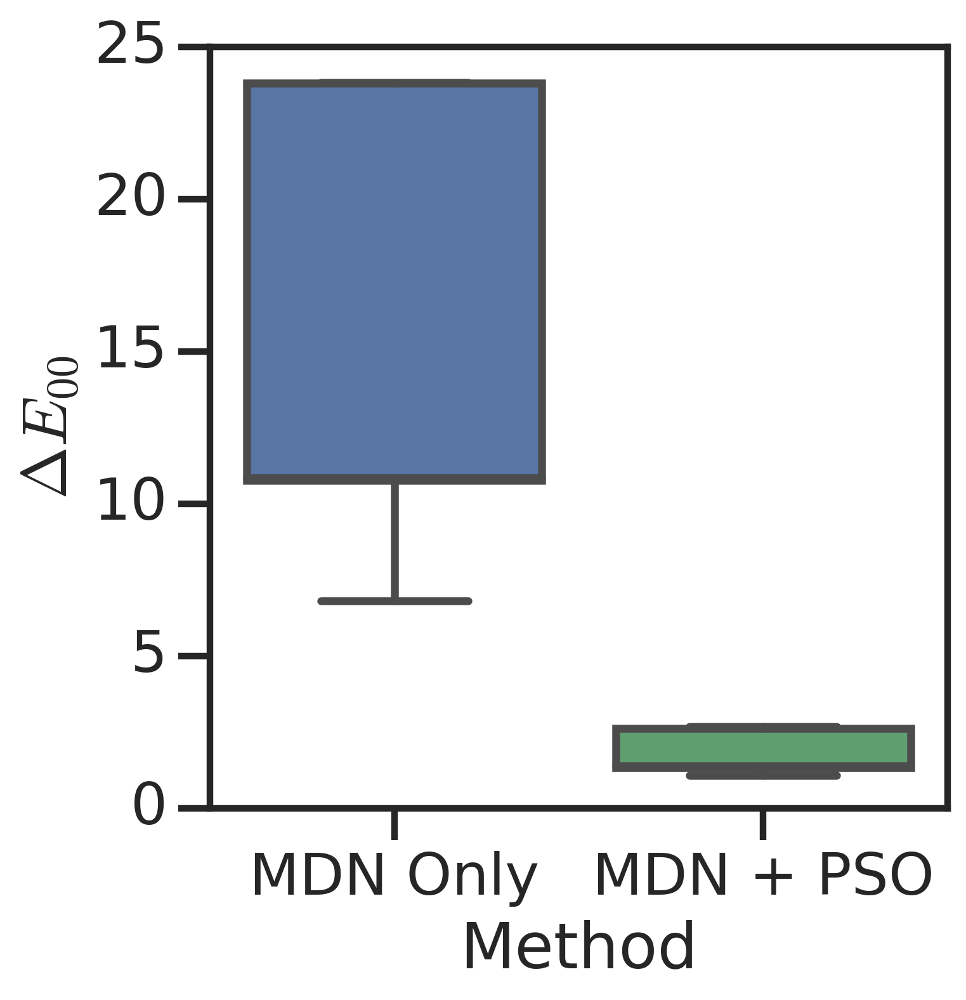

In [550]:
fig, ax = plt.subplots(figsize=(5, 5))
vals = np.concatenate((np.array(deltaEs_mdn_only), np.array(deltaEs_mdn_pso).reshape(-1)))
labels = ['MDN Only'] * len(mats_list) + ['MDN + PSO'] * len(mats_list)
df = pd.DataFrame({'vals':vals, 'Method':labels})
sns.boxplot(data=df, x='Method', y='vals')
plt.ylabel(r'$\Delta E_{00}$')

In [551]:
deltaEs_mdn_pso = np.array(deltaEs_mdn_pso).squeeze()
best_indices = np.argsort(deltaEs_mdn_pso)[:5]

swatches_mdn_only = []
swatches_mdn_pso = []
swatches_mdn_only.append(colour.plotting.ColourSwatch(RGB=RGBs))
swatches_mdn_pso.append(colour.plotting.ColourSwatch(RGB=RGBs))
for i, idx in enumerate(best_indices):
    swatches_mdn_only.append(colour.plotting.ColourSwatch(RGB=RGBs_mdn_only[idx]))
    swatches_mdn_pso.append(colour.plotting.ColourSwatch(RGB=RGBs_mdn_pso[idx]))

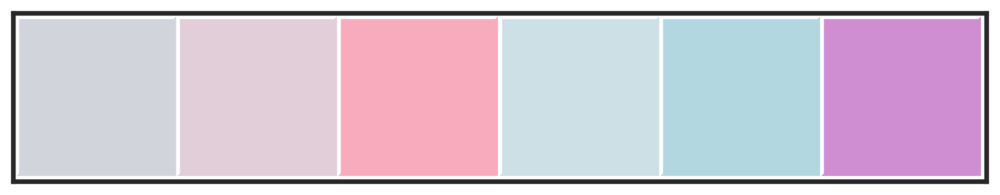

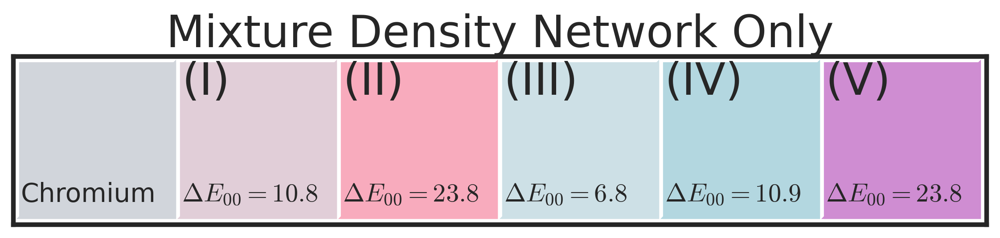

In [552]:
fig, ax = colour.plotting.plot_multi_colour_swatches(swatches_mdn_only, spacing=0.05)
ax.text(0, 0.1, 'Chromium', fontsize=14)
label = ['(I)', '(II)', '(III)', '(IV)', "(V)"]
for i in range(5):
    ax.text(i + 1 + 0.05 * (i + 1), 0.8, label[i])
    ax.text(i + 1 + 0.05 * (i + 1), 0.1, r'$\Delta E_{00}$' + '$= {:.1f}$'.format(deltaEs_mdn_only[best_indices[i]]), fontsize=14)
ax.set_title('Mixture Density Network Only')
# fig.savefig('./paper_figures/chrome_mdn_only.png', bbox_inches='tight')
fig

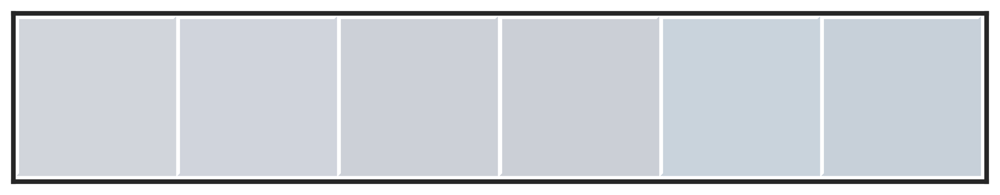

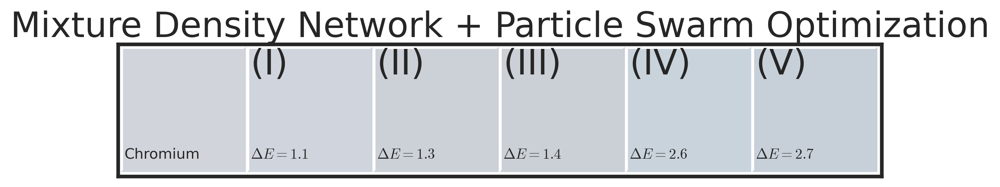

In [553]:

fig, ax = colour.plotting.plot_multi_colour_swatches(swatches_mdn_pso, spacing=0.05)
ax.text(0, 0.1, 'Chromium', fontsize=10)
label = ['(I)', '(II)', '(III)', '(IV)', "(V)"]
for i in range(5):
    ax.text(i + 1 + 0.05 * (i + 1), 0.8, label[i])
    ax.text(i + 1 + 0.05 * (i + 1), 0.1, r'$\Delta E = {:.1f}$'.format(deltaEs_mdn_pso[best_indices[i]]), fontsize=10)
ax.set_title('Mixture Density Network + Particle Swarm Optimization')
# fig.savefig('./paper_figures/chrome_mdn_pso.png', bbox_inches='tight')
fig

('HfO2', 'W', 'Ge', 'SiO2', 'Zn') [[106.0, 14.0, 12.0, 86.0, 100.0]]
('Ta2O5', 'W', 'Ge', 'SiO2', 'Zn') [[95.0, 15.0, 10.0, 43.0, 100.0]]
('Ta2O5', 'W', 'Ge', 'SiO2', 'Ni') [[94.0, 14.0, 11.0, 37.0, 100.0]]
('SiO2', 'W', 'Ge', 'SiO2', 'Zn') [[157.0, 14.0, 12.0, 87.0, 100.0]]
('SiO2', 'W', 'Ge', 'SiO2', 'Ni') [[158.0, 14.0, 11.0, 70.0, 100.0]]
('Al2O3', 'W', 'Ge', 'SiO2', 'Zn') [[141.0, 14.0, 11.0, 79.0, 100.0]]
('Al2O3', 'W', 'Ge', 'SiO2', 'Ni') [[142.0, 13.0, 15.0, 242.0, 100.0]]


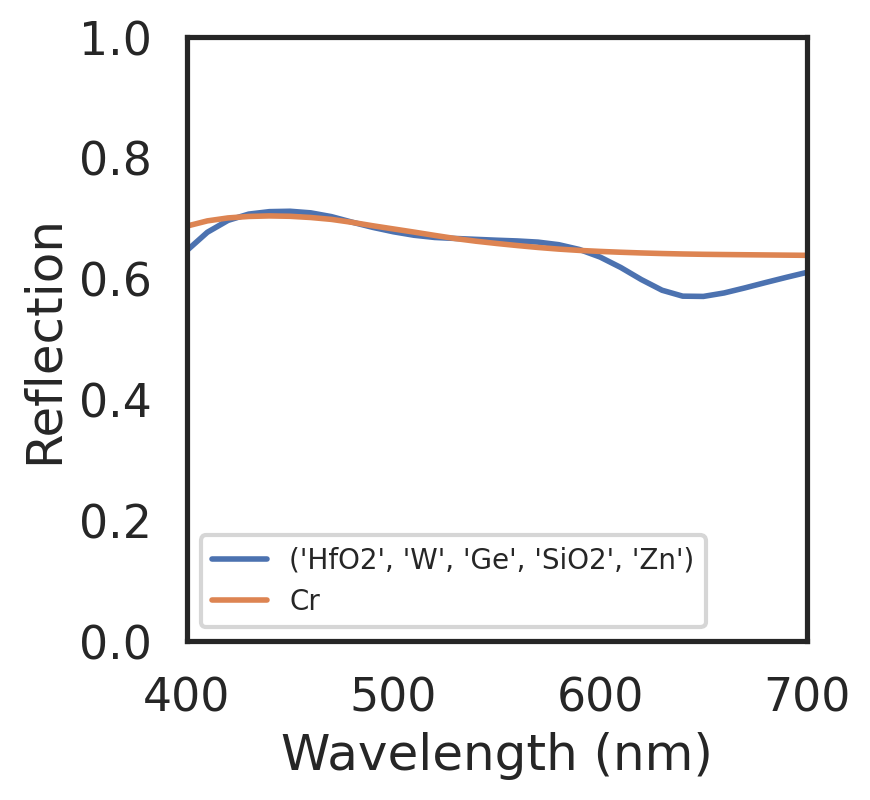

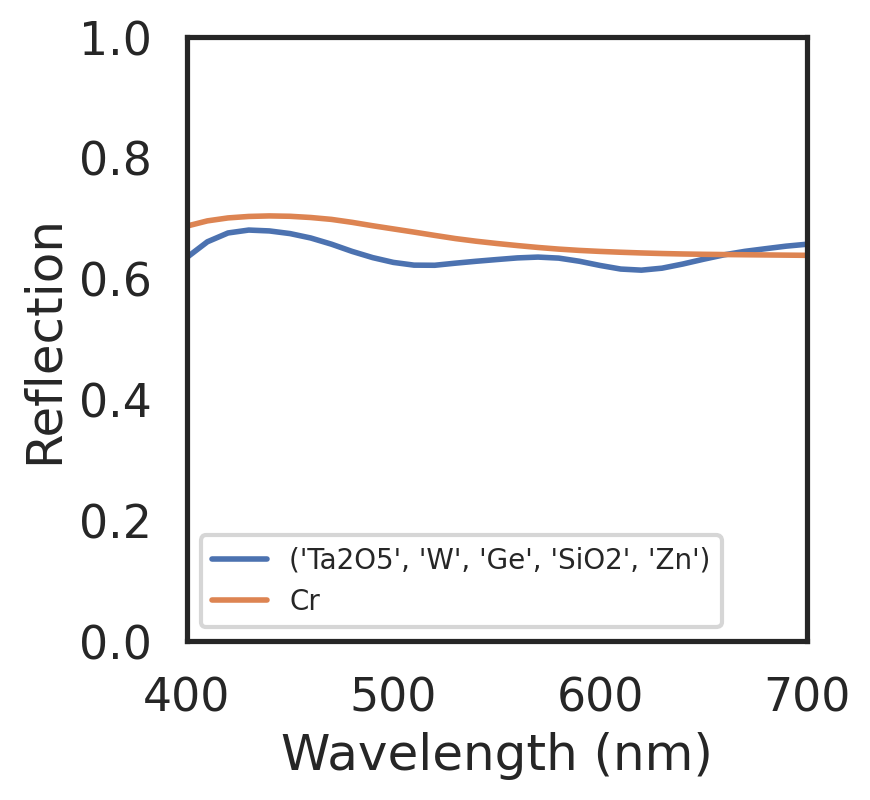

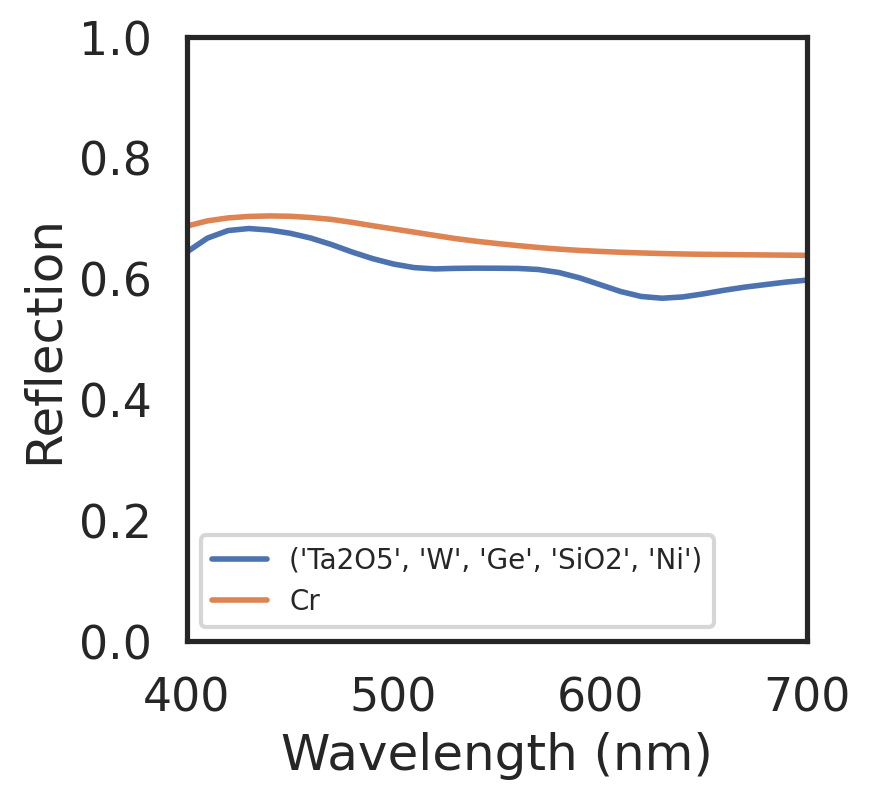

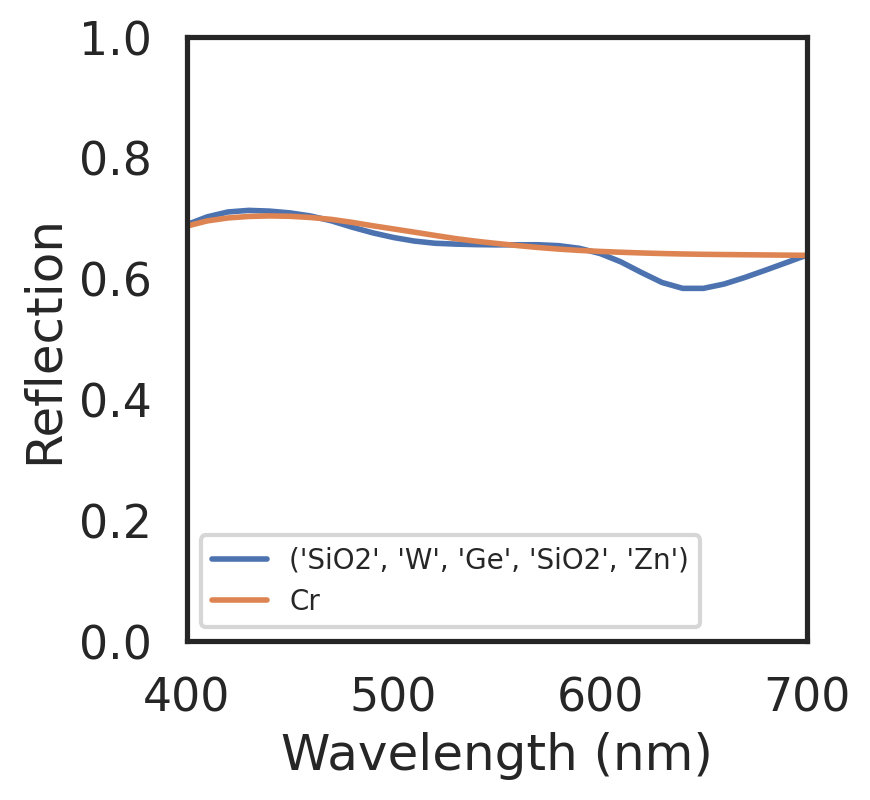

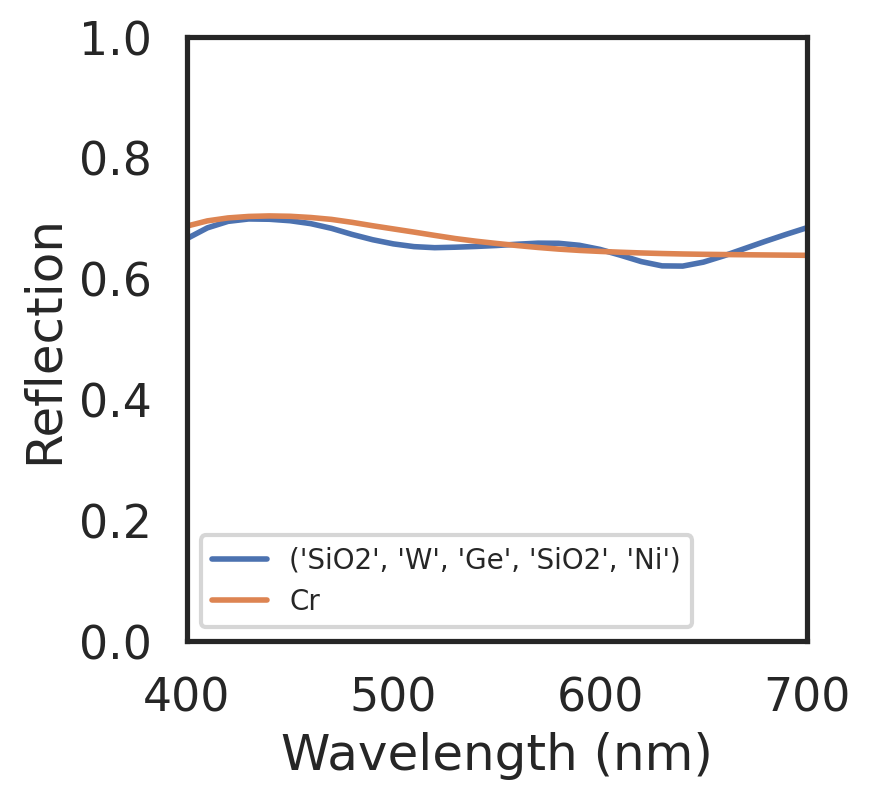

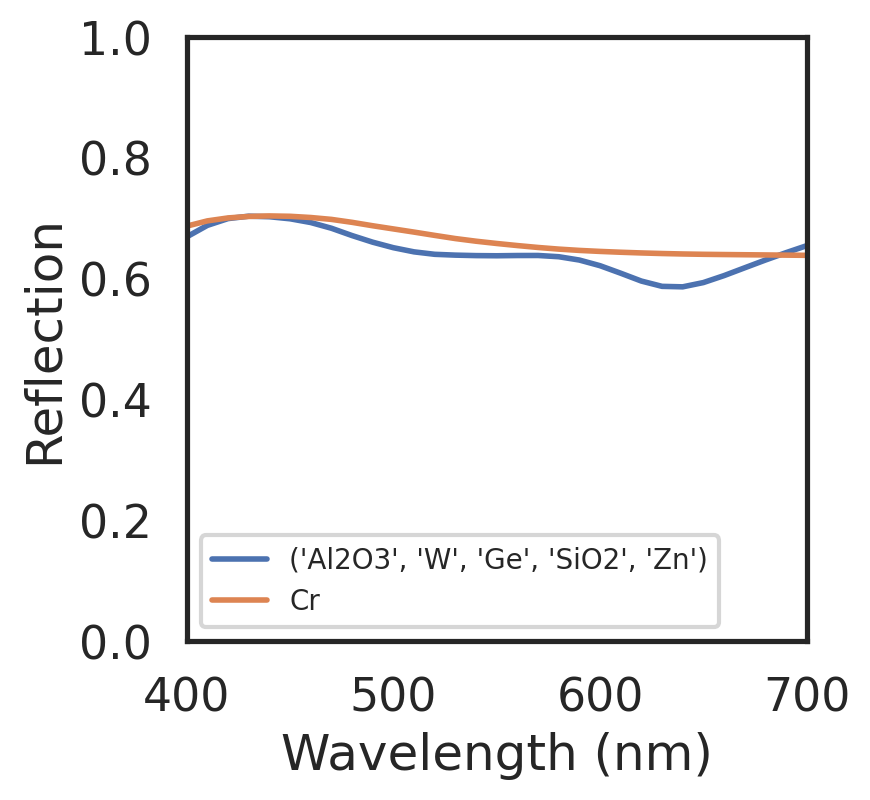

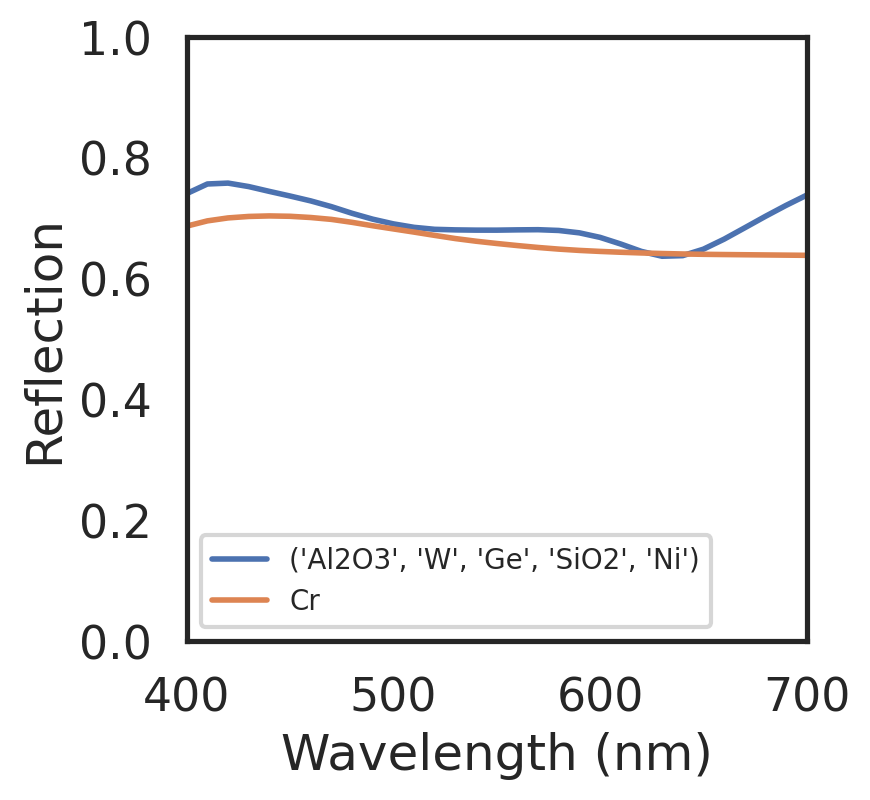

In [351]:


for design_mat, thickness in zip(mats_list, best_designs_mdn_pso):
    print(design_mat, thickness)

    nk_dict = dict(zip(['m1', 'm2', 'm3', 'm4', 'm5'], [NK_DICT[mat] for mat in design_mat]))
    R = []
    wavelengths = np.arange(0.4, 0.701, 0.01)

    thickness = list(thickness)[0]
    for i, lambda_vac in enumerate(wavelengths * 1e3):

        n_list = [1] + [val[i] for key, val in nk_dict.items()] + [1.5, 1]   

        inc_list = ['i', 'c', 'c', 'c', 'c', 'i', 'i', 'i']

        res = inc_tmm('s', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

        res_t = inc_tmm('p', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

        R.append((res['R'] + res_t['R']) / 2)

    nk_dict = dict(zip(['m1', 'm2', 'm3', 'm4', 'm5'], [NK_DICT[mat] for mat in ['Cr'] * 5]))
    thickness = [20] * 5
    R_cr = []
    wavelengths = np.arange(0.4, 0.701, 0.01)

    thickness = list(thickness)
    for i, lambda_vac in enumerate(wavelengths * 1e3):

        n_list = [1] + [val[i] for key, val in nk_dict.items()] + [1.5, 1]   

        inc_list = ['i', 'c', 'c', 'c', 'c', 'i', 'i', 'i']

        res = inc_tmm('s', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

        res_t = inc_tmm('p', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

        R_cr.append((res['R'] + res_t['R']) / 2)
    
    fig, ax = plt.subplots(figsize=(4, 4))
    plt.plot(wavelengths * 1000, R, label=design_mat, linewidth=2)
    plt.plot(wavelengths * 1000, R_cr, label='Cr', linewidth=2)
    plt.ylim([0, 1])
    plt.xlim([400, 700])
    plt.legend(loc='lower left', fontsize=10)
    plt.ylabel('Reflection')
    plt.xlabel('Wavelength (nm)')

In [361]:
Lab_designed = colour.XYZ_to_Lab(colour.sRGB_to_XYZ(np.array([199, 205, 214]) / 255))
colour.difference.delta_E_CIE2000(Labs_target, Lab_designed)

array([ 2.35192744])

In [422]:
nk_dict = dict(zip(['m1', 'm2', 'm3', 'm4', 'm5'], [NK_DICT[mat] for mat in ['HfO2', 'W', 'Ge', 'SiO2', 'Zn']]))
thickness = [ 105.,   15.,   10.,   83.,  100.]
R = []
wavelengths = np.arange(0.4, 0.701, 0.01)

thickness = list(thickness)
for i, lambda_vac in enumerate(wavelengths * 1e3):

    n_list = [1] + [val[i] for key, val in nk_dict.items()] + [1.5, 1]   

    inc_list = ['i', 'c', 'c', 'c', 'c', 'i', 'i', 'i']

    res = inc_tmm('s', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

    res_t = inc_tmm('p', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

    R.append((res['R'] + res_t['R']) / 2)

nk_dict = dict(zip(['m1', 'm2', 'm3', 'm4', 'm5'], [NK_DICT[mat] for mat in ['Cr'] * 5]))
thickness = [20] * 5
R_cr = []
wavelengths = np.arange(0.4, 0.701, 0.01)

thickness = list(thickness)
for i, lambda_vac in enumerate(wavelengths * 1e3):

    n_list = [1] + [val[i] for key, val in nk_dict.items()] + [1.5, 1]   

    inc_list = ['i', 'c', 'c', 'c', 'c', 'i', 'i', 'i']

    res = inc_tmm('s', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

    res_t = inc_tmm('p', n_list, [np.inf] + thickness + [5e3, np.inf], inc_list, 0, lambda_vac)

    R_cr.append((res['R'] + res_t['R']) / 2)



fig, ax = plt.subplots(figsize=(5, 5))
plt.plot(wavelengths * 1000, R, label='Design (I)', linewidth=4)
plt.plot(wavelengths * 1000, R_cr, label='Cr', linewidth=4)
plt.ylim([0, 1])
plt.xticks([400, 500, 600, 700])
plt.xlim([400, 700])
plt.legend()
plt.ylabel('Reflection')
plt.xlabel('Wavelength (nm)')

Text(0.5, 0, 'Wavelength (nm)')

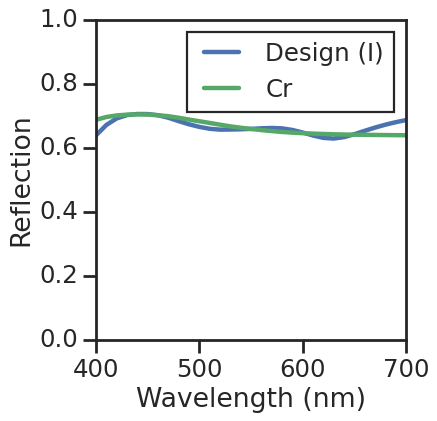

# Figure 4

In [44]:
quantize = True

for painting in ['./photo_data/eiffel_tower.jpg', './photo_data/great_wall.jpg', './photo_data/the_white_orchard.jpg', './photo_data/tulip_fields.jpg']:
# painting = './photo_data/eiffel_tower.jpg'
# painting = './photo_data/great_wall.jpg'
# painting = './photo_data/the_white_orchard.jpg'
# painting = './photo_data/wheatfield_under_thunderstorm.jpg'

    image = Image.open(painting)
    image.thumbnail((512, 512), Image.ANTIALIAS)
    RGB = np.array(image).reshape(-1, 3)

    if quantize:
        step_size = 10
        RGB_quantize = np.around(RGB / step_size).astype(int) * step_size
        RGBs = np.unique(RGB_quantize, axis=0)

    print(len(RGBs), len(np.unique(RGB, axis=0)), np.array(image).shape)
    # RGB = plt.imread(painting).reshape(-1, 3)
    # RGBs = RGB / 255
    Labs_target = [colour.XYZ_to_Lab(colour.sRGB_to_XYZ(item / 255)) for item in tqdm(RGBs)]

    nk = dataset.nk_scaler.transform(np.tile(dataset.flatten_nk(nk_dict), (len(RGBs), 1)))
    nk_input = torch.tensor(nk).float().to(device)

    RGB_input = torch.tensor(dataset.rgb_scaler.transform(RGBs)).float().to(device)
    design = model.mdn.mean_pred(nk_input, RGB_input)
    design = design.detach().cpu().numpy()
    design = dataset.thickness_scaler.inverse_transform(np.hstack((design, np.ones((len(design), 1)))))[:, :4]
    design = np.hstack((design, 100 * np.ones((len(design), 1))))

    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(image)
    ax[0].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[0].set_title('Original')

    ax[1].imshow(RGB_quantize.reshape(np.array(image).shape))
    ax[1].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[1].set_title('Quantized (step size 10)')

2020 48474 (512, 341, 3)


  0%|          | 0/2020 [00:00<?, ?it/s]

NameError: name 'device' is not defined

In [82]:
import matplotlib.image as mpimg
from PIL import Image
from tqdm.notebook import tqdm
sns.set_context('paper')

In [83]:

def plot_recon_figs(original, mdn_pso, mdn_only):
    quantize = True

    image = Image.open(original)
    image.thumbnail((512, 512), Image.ANTIALIAS)
    RGB = np.array(image).reshape(-1, 3)

    if quantize:
        step_size = 10
        RGB_quantize = np.around(RGB / step_size).astype(int) * step_size
        RGBs = np.unique(RGB_quantize, axis=0)

    Labs_target = [colour.XYZ_to_Lab(colour.sRGB_to_XYZ(item / 255)) for item in tqdm(RGBs)]

    fig, ax = plt.subplots(1, 3)

    ax[0].imshow(RGB_quantize.reshape(np.array(image).shape))
    ax[0].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[0].set_title('Quantized (step size 10)', fontsize=6)

    img = mpimg.imread(mdn_pso)
    ax[2].imshow(img)
    ax[2].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[2].set_title('Reconstructed (MDN + PSO)', fontsize=6)
    
    img = mpimg.imread(mdn_only)
    ax[1].imshow(img)
    ax[1].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[1].set_title('Reconstructed (MDN only)', fontsize=6)
    plt.show()

  0%|          | 0/1395 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


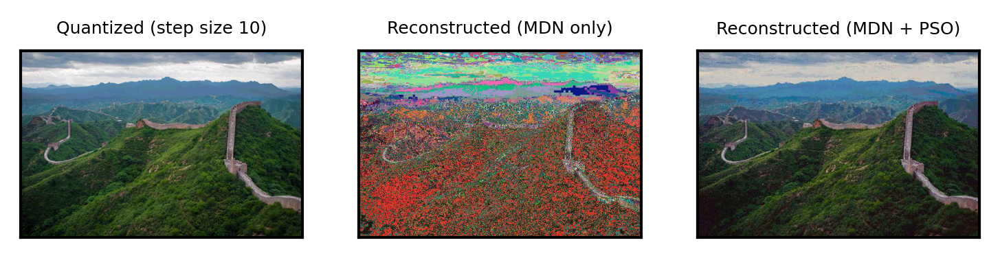

In [84]:
plot_recon_figs('./photo_data/great_wall.jpg', 'paper_figures/reconstruction/reat_wall_recon_randomFalse_time6383.83sec_deltaE5.69.jpg', 'paper_figures/reconstruction/reat_wall_recon_mdn_only_time22.89sec_deltaE21.46.jpg')

  0%|          | 0/2279 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


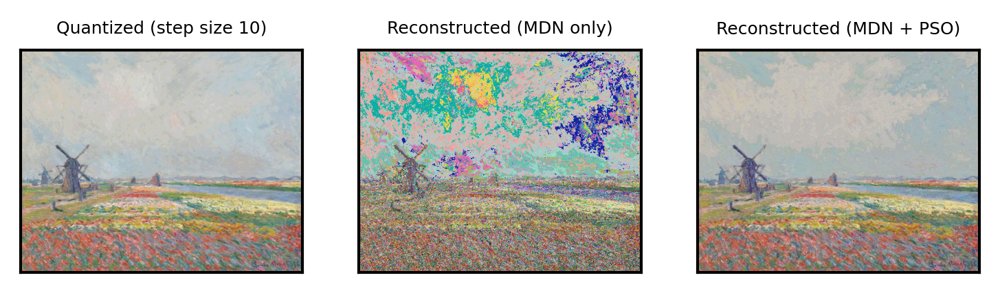

In [85]:
plot_recon_figs('./photo_data/tulip_fields.jpg', 'paper_figures/reconstruction/tulip_fields_recon_randomFalse_time9246.65sec_deltaE3.48.jpg', 'paper_figures/reconstruction/tulip_fields_recon_mdn_only_time38.87sec_deltaE19.45.jpg')

  0%|          | 0/2428 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


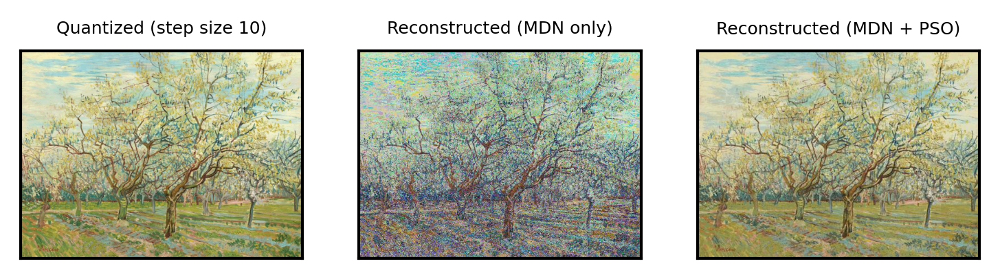

In [86]:
plot_recon_figs('./photo_data/the_white_orchard.jpg', 'paper_figures/reconstruction/the_white_orchard_recon_randomFalse_time9917.21sec_deltaE3.76.jpg', 'paper_figures/reconstruction/the_white_orchard_recon_mdn_only_time37.01sec_deltaE18.55.jpg')

In [88]:
def plot_style_transfer_figs(original, transfer, mdn_pso):
    quantize = True

    image = Image.open(original)
    image.thumbnail((512, 512), Image.ANTIALIAS)
    RGB = np.array(image).reshape(-1, 3)

    if quantize:
        step_size = 10
        RGB_quantize = np.around(RGB / step_size).astype(int) * step_size
        RGBs = np.unique(RGB_quantize, axis=0)

    Labs_target = [colour.XYZ_to_Lab(colour.sRGB_to_XYZ(item / 255)) for item in tqdm(RGBs)]

    fig, ax = plt.subplots(1, 3)
    
    ax[0].imshow(image)
    ax[0].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[0].set_title('Original Photo', fontsize=12)

    img = mpimg.imread(transfer)
    ax[1].imshow(img)
    ax[1].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[1].set_title('Style Transferred', fontsize=12)
    
    img = mpimg.imread(mdn_pso)
    ax[2].imshow(img)
    ax[2].tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[2].set_title('Reconstructed', fontsize=12)
    plt.show()
    
    return fig

100%|█████████████████████████████████████████████████| 2259/2259 [00:00<00:00, 2306.08it/s]


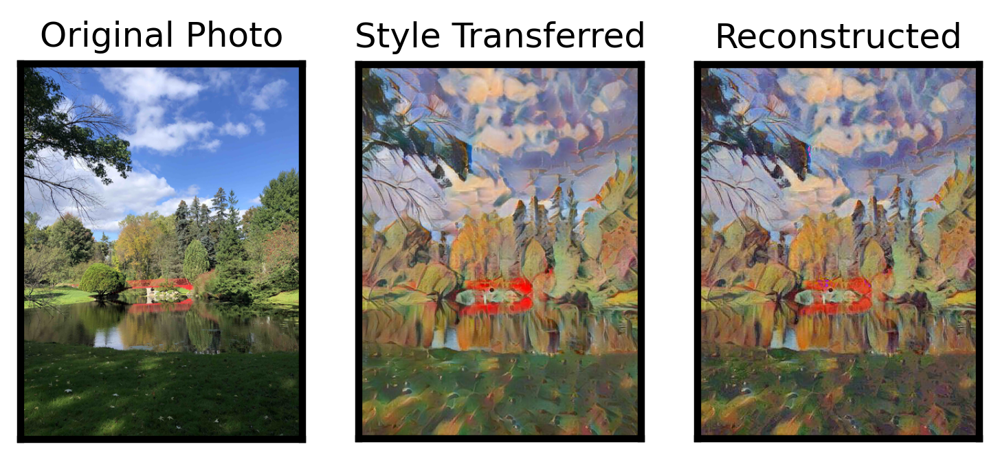

In [95]:
matplotlib.rcParams['figure.dpi']=300
fig = plot_style_transfer_figs('./photo_data/bridge.jpg', './photo_data/bridge_guo_group.jpg', 'paper_figures/reconstruction/bridge_guo_grou_recon_randomFalse_time11010.28sec_deltaE3.97.jpg')
# fig.savefig('./paper_figures/guo_group_bridge.png', bbox_layout='tight')

Text(0.5, 1.0, 'Style Source')

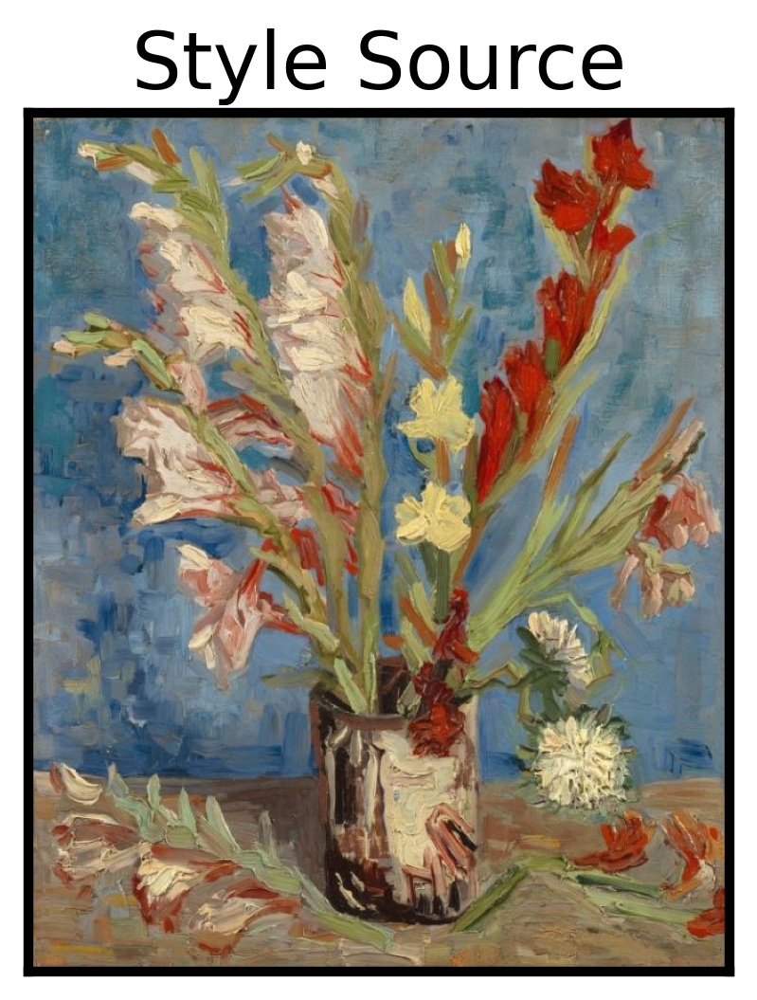

In [99]:
fig, ax = plt.subplots()
sns.set_context('poster')
img = mpimg.imread('./photo_data/vangogh_flower.jpg')
ax.imshow(img)
ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
ax.set_title('Style Source', fontsize=20)

100%|███████████████████████████████████████████████████████████████| 2482/2482 [00:01<00:00, 2311.65it/s]


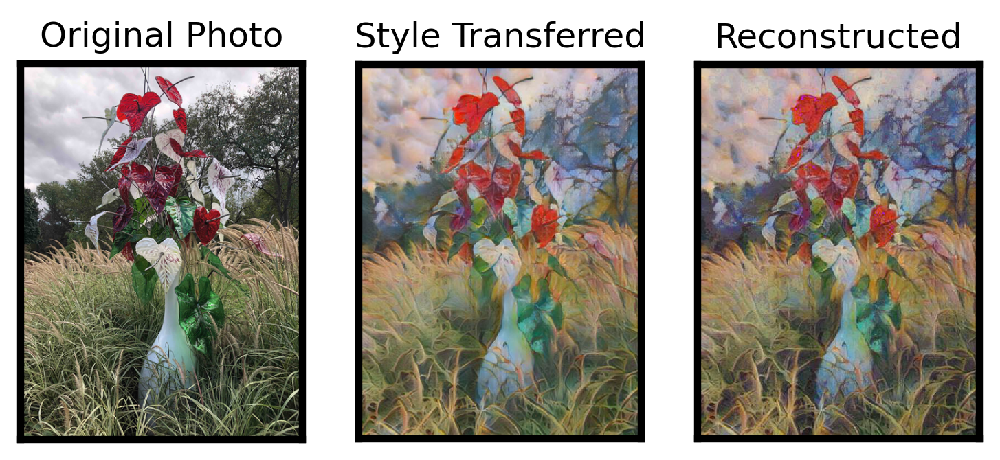

/tmp/ipykernel_3592612/3011197508.py:2: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_layout" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig('./paper_figures/guo_group_flower.png', bbox_layout='tight')


In [91]:
fig = plot_style_transfer_figs('./photo_data/flower.jpg', './photo_data/flower_guo_group.jpg', 'paper_figures/reconstruction/flower_guo_grou_recon_randomFalse_time11249.03sec_deltaE3.93.jpg')
fig.savefig('./paper_figures/guo_group_flower.png', bbox_layout='tight')

100%|███████████████████████████████████████████████████████████████| 2988/2988 [00:01<00:00, 2289.58it/s]


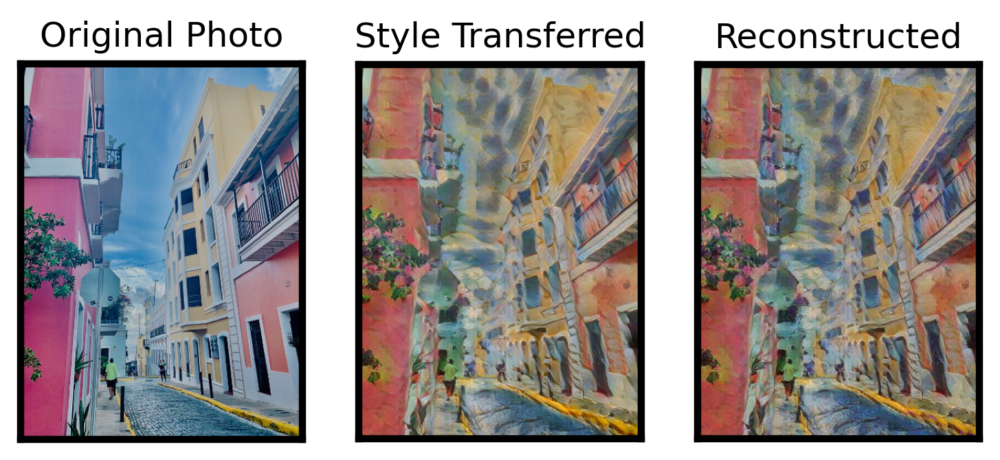

/tmp/ipykernel_3592612/1583844813.py:6: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_layout" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig('./paper_figures/guo_group_san_juan.png', bbox_layout='tight')


In [90]:
import colour
from tqdm import tqdm
sns.set_context('poster')
fig = plot_style_transfer_figs('./photo_data/san_juan_original.jpg', './photo_data/san_juan.jpg', 'paper_figures/reconstruction/san_juan_recon_randomFalse_time7349.53sec_deltaE3.28.jpg')

fig.savefig('./paper_figures/guo_group_san_juan.png', bbox_layout='tight')

In [192]:
import itertools
D = ['TiO2', 'SiO2', 'MgF2', 'HfO2', 'Al2O3', 'ZnO', 'ZnS', 'ZnSe', 'Ta2O5', 'Fe2O3']
M = ['Ag', 'Al', 'Ni', "Ge", 'Ti', 'Zn', 'Cr', 'Cu', 'Au', 'W']
mats_list = list(itertools.product(D, M, M, D, M))

In [193]:
for file in glob.glob('./paper_figures/reconstruction/*ratios.pkl'):
    ratios = pkl.load(open(file , 'rb'))
    print(file)
    print(mats_list[np.argmax(ratios)])

./paper_figures/reconstruction/michigan_udnie_style_ratios.pkl
('SiO2', 'Ge', 'Al', 'MgF2', 'Cr')
./paper_figures/reconstruction/michigan_stadium_ratios.pkl
('HfO2', 'Au', 'Ti', 'SiO2', 'Au')
./paper_figures/reconstruction/yellowstone_haozhu_ratios.pkl
('HfO2', 'Au', 'Au', 'ZnSe', 'Ge')
./paper_figures/reconstruction/the_white_orchard_ratios.pkl
('Al2O3', 'Ge', 'Al', 'Al2O3', 'Zn')
./paper_figures/reconstruction/eiffel_tower_ratios.pkl
('ZnO', 'Cr', 'Cu', 'Al2O3', 'Au')
./paper_figures/reconstruction/san_juan_ratios.pkl
('ZnO', 'Ti', 'Au', 'MgF2', 'Au')
./paper_figures/reconstruction/yellow_stone_4_ratios.pkl
('ZnO', 'Cr', 'Cu', 'Al2O3', 'Au')
./paper_figures/reconstruction/tulip_fields_ratios.pkl
('Ta2O5', 'Au', 'Ti', 'Al2O3', 'Au')
./paper_figures/reconstruction/reat_wall_ratios.pkl
('HfO2', 'Au', 'Ti', 'SiO2', 'Au')
./paper_figures/reconstruction/flower_guo_grou_ratios.pkl
('Ta2O5', 'Au', 'Ti', 'Al2O3', 'Au')
./paper_figures/reconstruction/bridge_guo_grou_ratios.pkl
('HfO2', 'Au', '

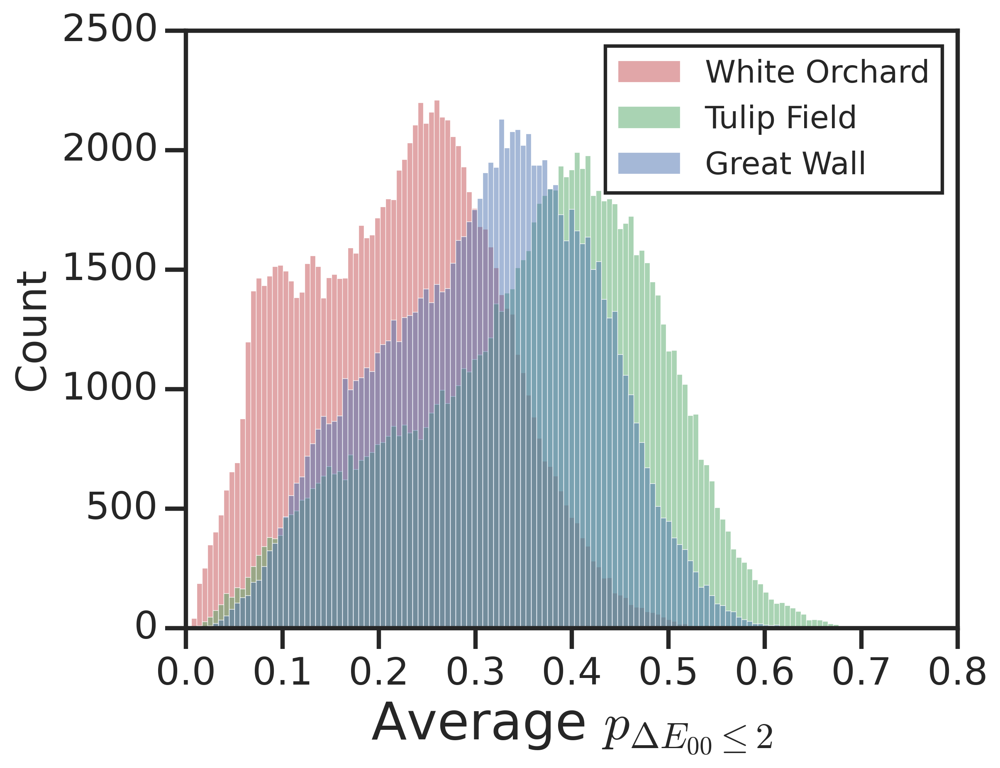

In [556]:
ratios_1 = pkl.load(open('./paper_figures/reconstruction/the_white_orchard_ratios.pkl', 'rb'))
ratios_2 = pkl.load(open('./paper_figures/reconstruction/tulip_fields_ratios.pkl', 'rb'))
ratios_3 = pkl.load(open('./paper_figures/reconstruction/reat_wall_ratios.pkl', 'rb'))
df = {'Ratios':ratios_1 + ratios_2 + ratios_3, 'Picture':np.repeat(['White Orchard', 'Tulip Field', 'Great Wall'], 100000)}
ax = sns.histplot(df, x = 'Ratios', hue='Picture')
plt.setp(ax.get_legend().get_texts(), fontsize='8')
plt.setp(ax.get_legend().get_title(), fontsize='8')
plt.xlabel(r'Average $p_{\Delta E _{00} \leq 2}$', fontsize=30)
plt.legend(['White Orchard', 'Tulip Field', 'Great Wall'], fontsize=18)
# plt.ylabel('Counts')
# plt.legend(['White Orchard', 'Tulip Field', 'Great Wall'], fontsize=12)

In [303]:
df = {'Delta E': [3.76, 3.48, 5.69, 18.55, 19.45, 21.46], "Picture":['White Orchard', 'Tulip Field', 'Great Wall', 'White Orchard', 'Tulip Field', 'Great Wall'], 'Method':['MDN + PSO'] * 3 + ['MDN'] * 3}

Text(0, 0.5, '$\\Delta E_{00}$')

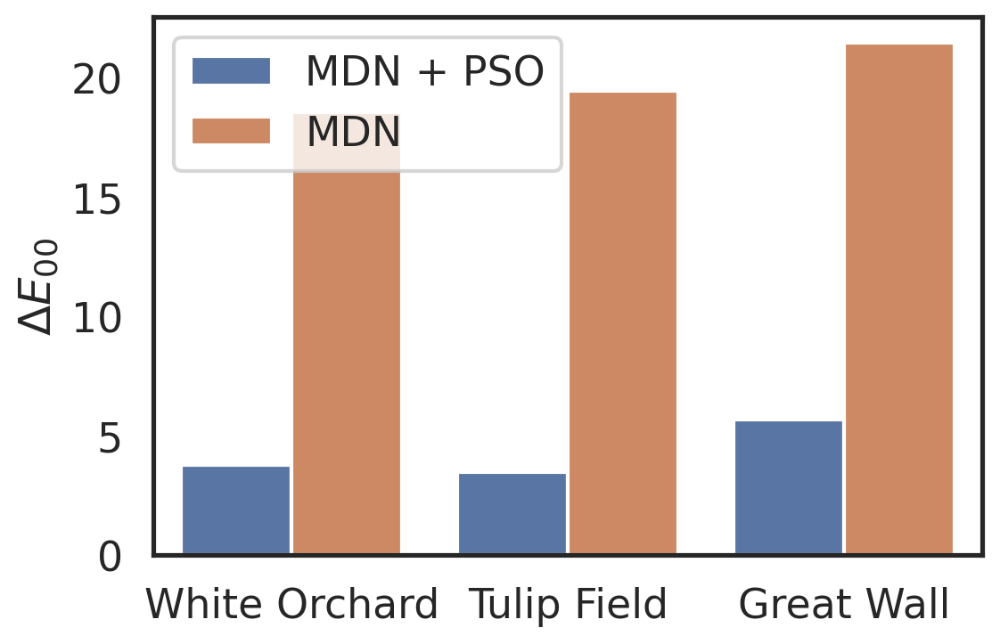

In [304]:
sns.barplot(data=df, x='Picture', y='Delta E', hue='Method')
plt.ylabel(r"$\Delta E_{00}$")

  0%|          | 0/2020 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


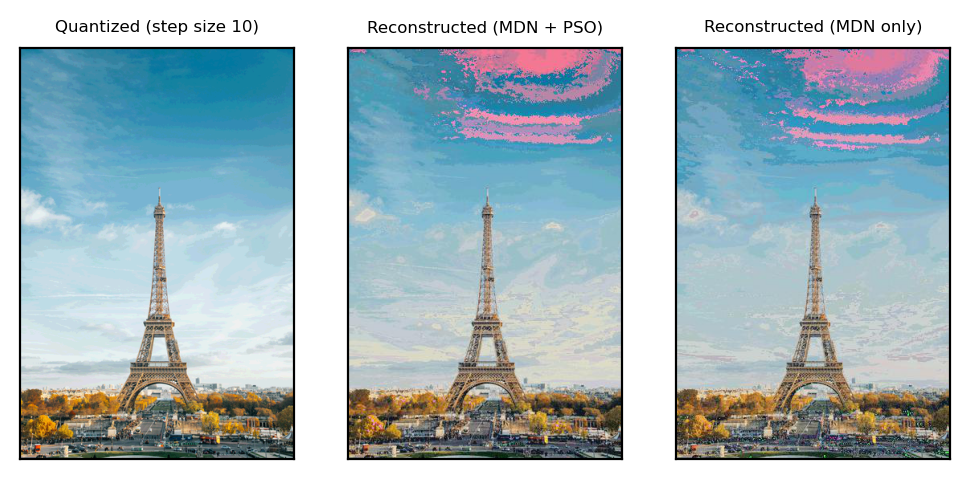

In [122]:
plot_recon_figs('./photo_data/eiffel_tower.jpg', 'paper_figures/reconstruction/eiffel_tower_recon_randomFalse_time9503.72sec_deltaE3.55.jpg', 'paper_figures/reconstruction/eiffel_tower_recon_randomTrue_time8576.44sec_deltaE4.96.jpg')

# Figure 5
* number of mixtures
* multitask

In [3]:
from tensorflow.python.summary.summary_iterator import summary_iterator
sns.set_context('poster')

In [14]:
def extract_best(exp_path, metric=None, mode='min'):
    event_files = glob.glob(exp_path)
    data = {'expname':[], metric:[]}
    for _, file in enumerate(event_files):
        exp = file.split('/')[3]
        print(exp)
        if mode=='min':
            best_val = np.float('inf')
        else:
            best_val = -np.float('inf')
                
        for e in summary_iterator(file):
                
            for v in e.summary.value:
                if v.tag  == metric:
                    if mode == 'min':
                        best_val = v.simple_value if v.simple_value < best_val else best_val
                    else:
                        best_val = v.simple_value if v.simple_value > best_val else best_val

        data['expname'].append(exp)
        data[metric].append(best_val)
            
    return data

In [15]:
def extract_best_mixture(exp_path, metric=None, mode='min'):
    event_files = glob.glob(exp_path)
    data = {'expname':[], metric:[], 'seed':[]}
    for _, file in enumerate(event_files):
        exp = file.split('/')[3]
        
        print(exp)
        if mode=='min':
            best_val = np.float('inf')
        else:
            best_val = -np.float('inf')
                
        for e in summary_iterator(file):
                
            for v in e.summary.value:
                if v.tag  == metric:
                    if mode == 'min':
                        best_val = v.simple_value if v.simple_value < best_val else best_val
                    else:
                        best_val = v.simple_value if v.simple_value > best_val else best_val

        data['expname'].append(int(exp.split('_')[0][4:]))
        data['seed'].append(int(exp.split('_')[2][-1]))
        data[metric].append(best_val)
            
    return data

nmix25600_400K_seed2
nmix1600_400K_seed1
nmix1600_400K_seed0
nmix25600_400K_seed1
nmix6000_400K_seed2
nmix3200_400K_seed2
nmix200_400K_seed0
nmix12800_400K_seed2
nmix25600_400K_seed0
nmix12800_400K_seed0
nmix6000_400K_seed1
nmix12800_400K_seed1
nmix3200_400K_seed0
nmix3200_400K_seed1
nmix800_400K_seed2
nmix51200_400K_seed2
nmix51200_400K_seed1
nmix400_400K_seed1
nmix51200_400K_seed0
nmix6000_400K_seed0
nmix200_400K_seed1
nmix800_400K_seed0
nmix400_400K_seed2
nmix800_400K_seed1
nmix400_400K_seed0
nmix200_400K_seed2
nmix1600_400K_seed2


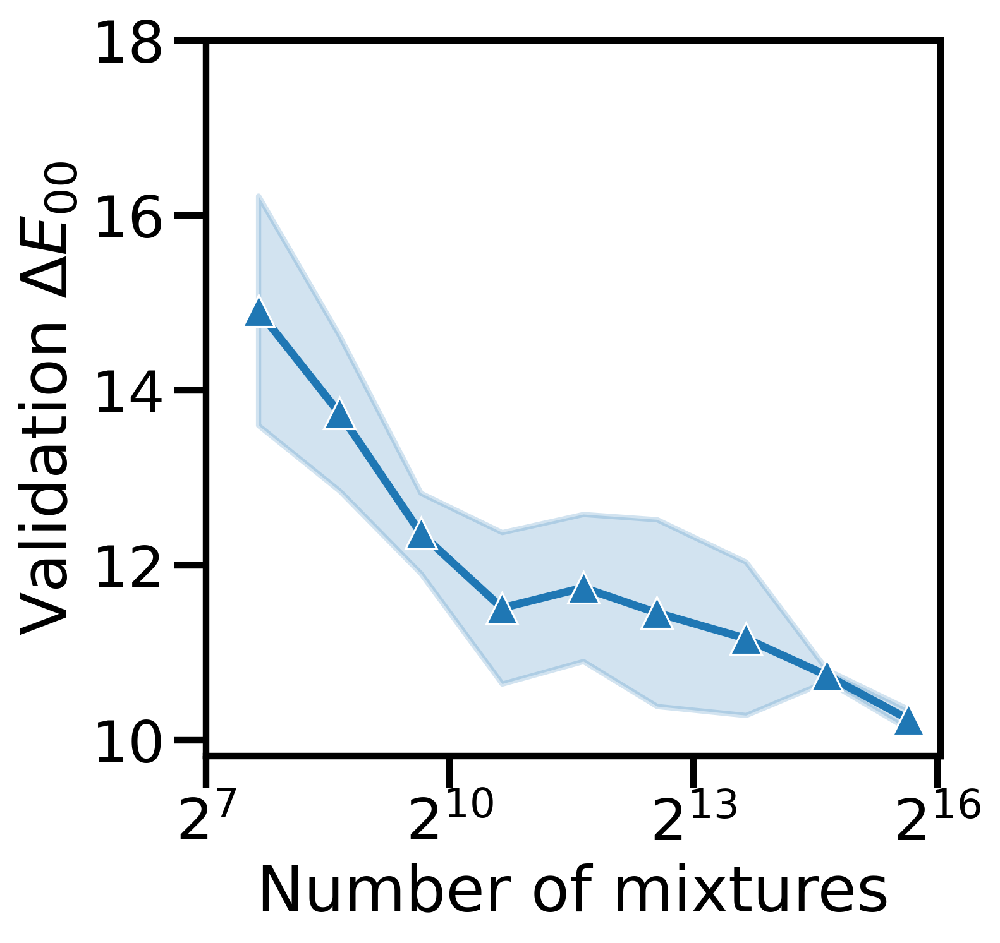

In [22]:
plt.figure(figsize=(5, 5))
metric = 'val_deltaE'
data = extract_best_mixture('./logs/1202_nmixtures_400K/*/lightning_logs/version_0/*.0', metric=metric, mode='min')
sns.lineplot(data=data, x='expname', y=metric, ci='sd', marker='^')
plt.xscale('log', base=2)
plt.ylabel(r'Validation $\Delta E_{00}$')
plt.xlabel('Number of mixtures')
plt.yticks([10, 12, 14, 16, 18])
plt.xticks([2 ** 7, 2 ** 10, 2 ** 13, 2** 16])
plt.show()

nmix25600_400K_seed2
nmix1600_400K_seed1
nmix1600_400K_seed0
nmix25600_400K_seed1
nmix6000_400K_seed2
nmix3200_400K_seed2
nmix200_400K_seed0
nmix12800_400K_seed2
nmix25600_400K_seed0
nmix12800_400K_seed0
nmix6000_400K_seed1
nmix12800_400K_seed1
nmix3200_400K_seed0
nmix3200_400K_seed1
nmix800_400K_seed2
nmix51200_400K_seed2
nmix51200_400K_seed1
nmix400_400K_seed1
nmix51200_400K_seed0
nmix6000_400K_seed0
nmix200_400K_seed1
nmix800_400K_seed0
nmix400_400K_seed2
nmix800_400K_seed1
nmix400_400K_seed0
nmix200_400K_seed2
nmix1600_400K_seed2


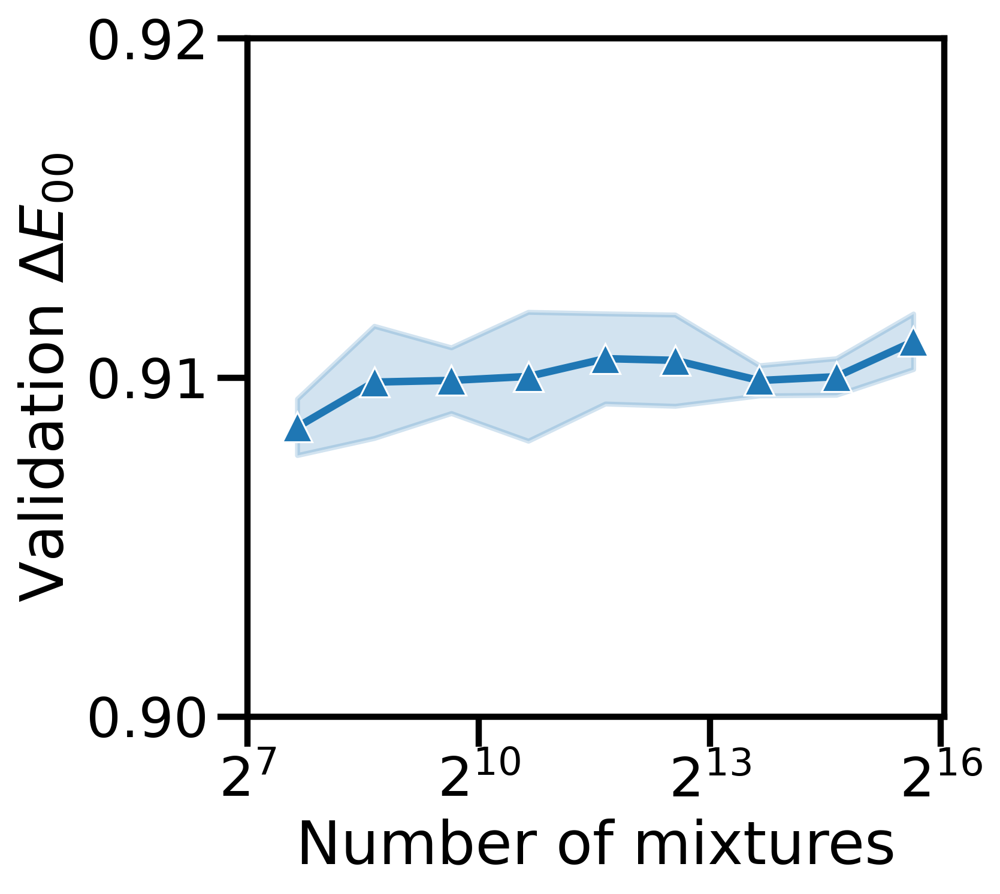

In [25]:
plt.figure(figsize=(5, 5))
metric = 'val_auc'
data = extract_best_mixture('./logs/1202_nmixtures_400K/*/lightning_logs/version_0/*.0', metric=metric, mode='max')
sns.lineplot(data=data, x='expname', y=metric, ci='sd', marker='^')
plt.xscale('log', base=2)
plt.ylabel(r'Validation $\Delta E_{00}$')
plt.xlabel('Number of mixtures')
plt.yticks([0.9, 0.91, 0.92])
plt.xticks([2 ** 7, 2 ** 10, 2 ** 13, 2** 16])
plt.show()

In [ ]:
plt.figure(figsize=(5, 5))
metric = 'val_deltaE'
data = extract_best('./logs/1202_nmixtures_400K/*/lightning_logs/version_0/*.0', metric=metric, mode='min')
exps = [25600, 1600, 6400, 12800, 800, 3200, 400, 200, 51200]
vals = data[metric]
exps, vals = zip(*sorted(zip(exps, vals)))
plt.plot(exps,vals, '-*')
plt.xscale('log', base=2)
plt.ylabel(r'Validation $\Delta E_{00}$')
plt.xlabel('Number of mixtures')
plt.yticks([10, 12, 14, 16, 18])
plt.xticks([2 ** 7, 2 ** 10, 2 ** 13, 2** 16])
plt.show()

plt.figure(figsize=(5, 5))
metric = 'val_auc'
data = extract_best('./logs/1202_nmixtures_400K/*/lightning_logs/version_0/*.0', metric=metric, mode='mac')
exps = [25600, 1600, 6400, 12800, 800, 3200, 400, 200, 51200]
vals = data[metric]
exps, vals = zip(*sorted(zip(exps, vals)))
plt.plot(exps,vals, '-*')
plt.ylim([0.9, 0.92])
plt.xscale('log', base=2)
plt.ylabel('Validation AUC')
plt.xlabel('Number of mixtures')
plt.yticks([0.9, 0.91, 0.92])
plt.xticks([2 ** 7, 2 ** 10, 2 ** 13, 2** 16])
plt.show()

In [26]:
def extract_best_multitask(exp_path, metric=None, mode='min'):
    event_files = glob.glob(exp_path)
    data = {'expname':[], metric:[], 'seed':[]}
    for _, file in enumerate(event_files):
        exp = file.split('/')[3]
        
        print(exp)
        if mode=='min':
            best_val = np.float('inf')
        else:
            best_val = -np.float('inf')
                
        for e in summary_iterator(file):
                
            for v in e.summary.value:
                if v.tag  == metric:
                    if mode == 'min':
                        best_val = v.simple_value if v.simple_value < best_val else best_val
                    else:
                        best_val = v.simple_value if v.simple_value > best_val else best_val

        data['expname'].append(int(exp.split('_')[0][5:]))
        data['seed'].append(int(exp.split('_')[1][-1]))
        data[metric].append(best_val)
            
    return data

alpha0_seed1
alpha1_seed1
alpha10_seed0
alpha10_seed1
alpha5_seed2
alpha5_seed1
alpha10_seed2
alpha2_seed0
alpha1_seed2
alpha0_seed0
alpha0_seed2
alpha5_seed0
alpha2_seed2
alpha2_seed1
alpha1_seed0


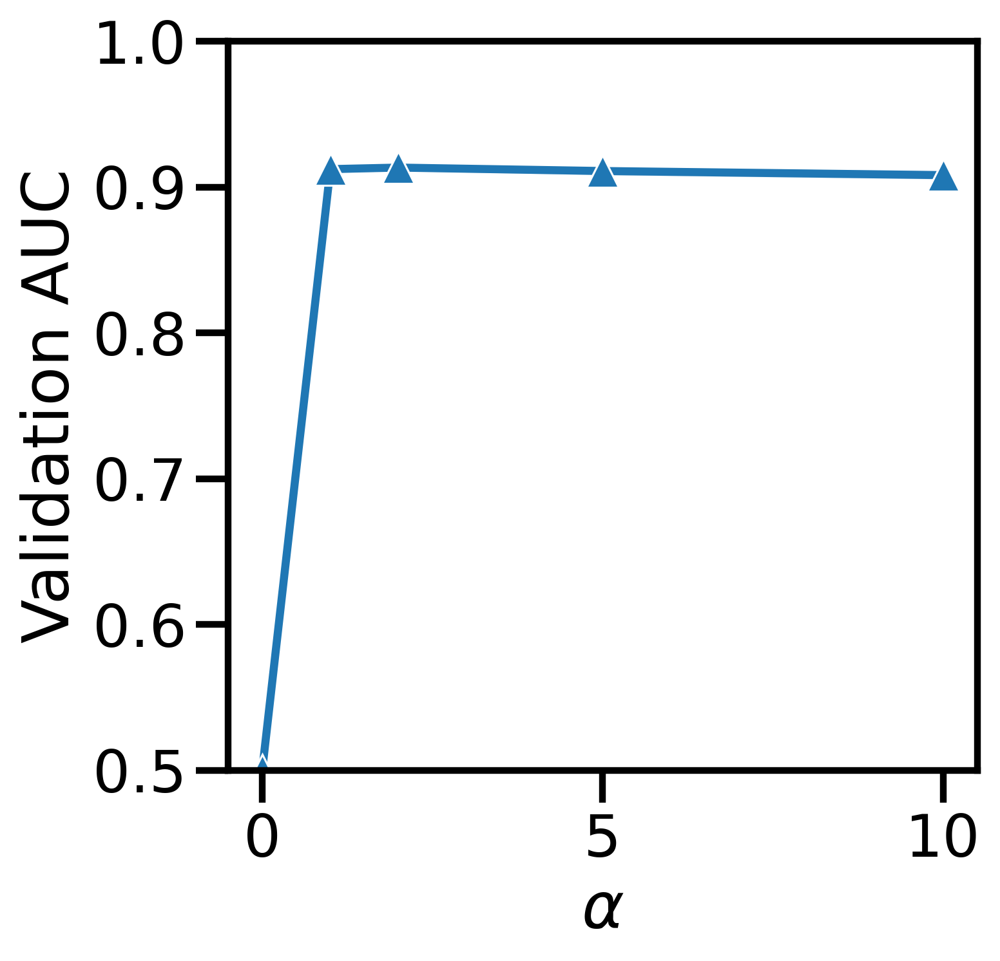

In [52]:
plt.figure(figsize=(5, 5))
metric = 'val_auc'
data = extract_best_multitask('./logs/1203_multitask/*/lightning_logs/version_0/*.0', metric=metric, mode='max')
sns.lineplot(data=data, x='expname', y=metric, ci='sd', marker='^')
plt.ylabel('Validation AUC')
plt.xlabel(r'$\alpha$')
plt.ylim([0.5, 1])
plt.show()

In [5]:
def extract_data_from_exp(exp_path):
    event_files = glob.glob(exp_path)

    data = {'val_auc':[], 'val_deltaE':[], 'val_loss':[]}
    for _, file in enumerate(event_files):
        for e in summary_iterator(file):
            for v in e.summary.value:
                if v.tag in ('val_auc', 'val_deltaE', 'val_loss'):
                    data[v.tag].append(v.simple_value)
                else:
                    pass
    return data

In [24]:
data = {'val_auc':[], 'val_deltaE':[], 'val_loss':[], 'method':[], 'epochs':[], 'seed':[]}

for seed in [0, 2, 3]:
    for exp_name in ['primitive_100K', 'primitive_150K', 'augmented_150K', 'augmented_400K']:
        logdir = exp_name + '_seed{}'.format(seed)
        file = glob.glob(f'./logs/1206_compare_augmentation/{logdir}/lightning_logs/version_0/events.out.tfevents.*')[0]
        count = 0
        for e in summary_iterator(file):
            for v in e.summary.value:
                if v.tag in ('val_auc', 'val_deltaE', 'val_loss'):
                    data[v.tag].append(v.simple_value)
                    count += 1
                else:
                    pass
        data['method'] += [exp_name] * (count // 3)
        data['epochs'] += (np.arange(count // 3) * 25).tolist()
        data['seed'].append(seed)

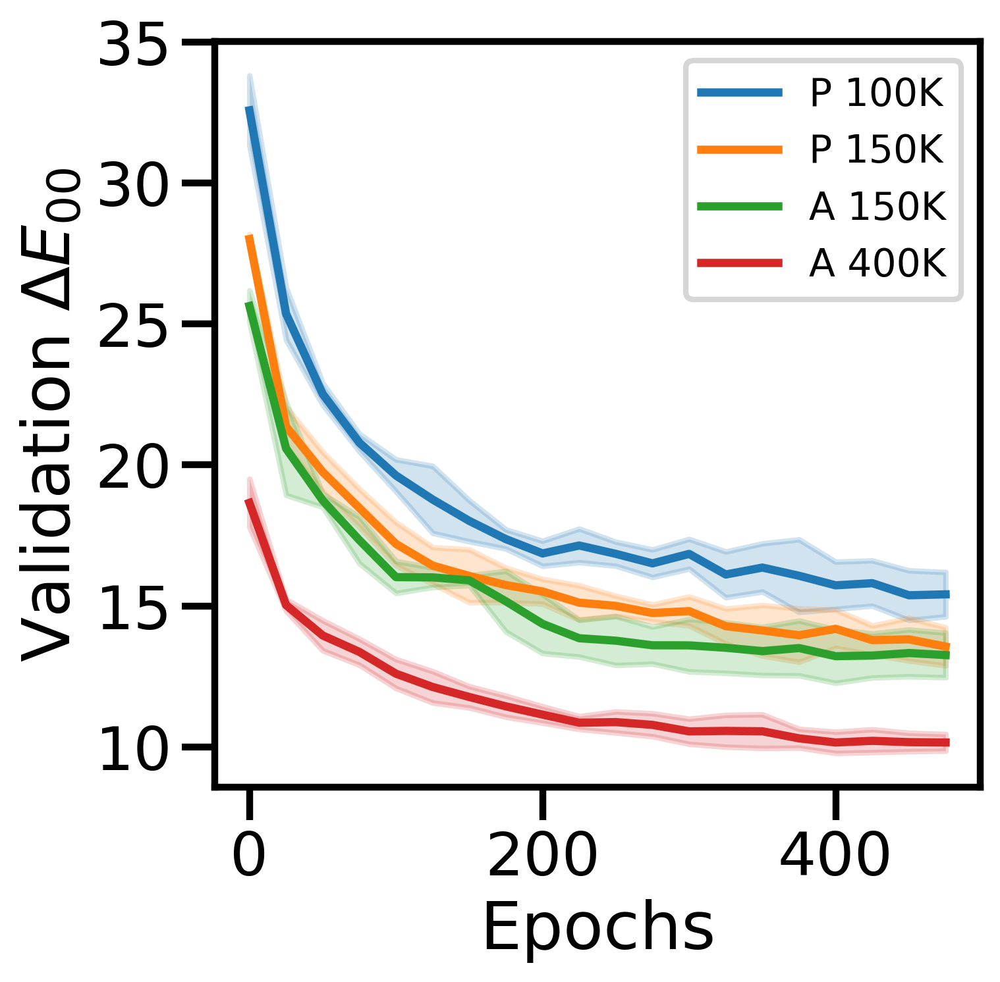

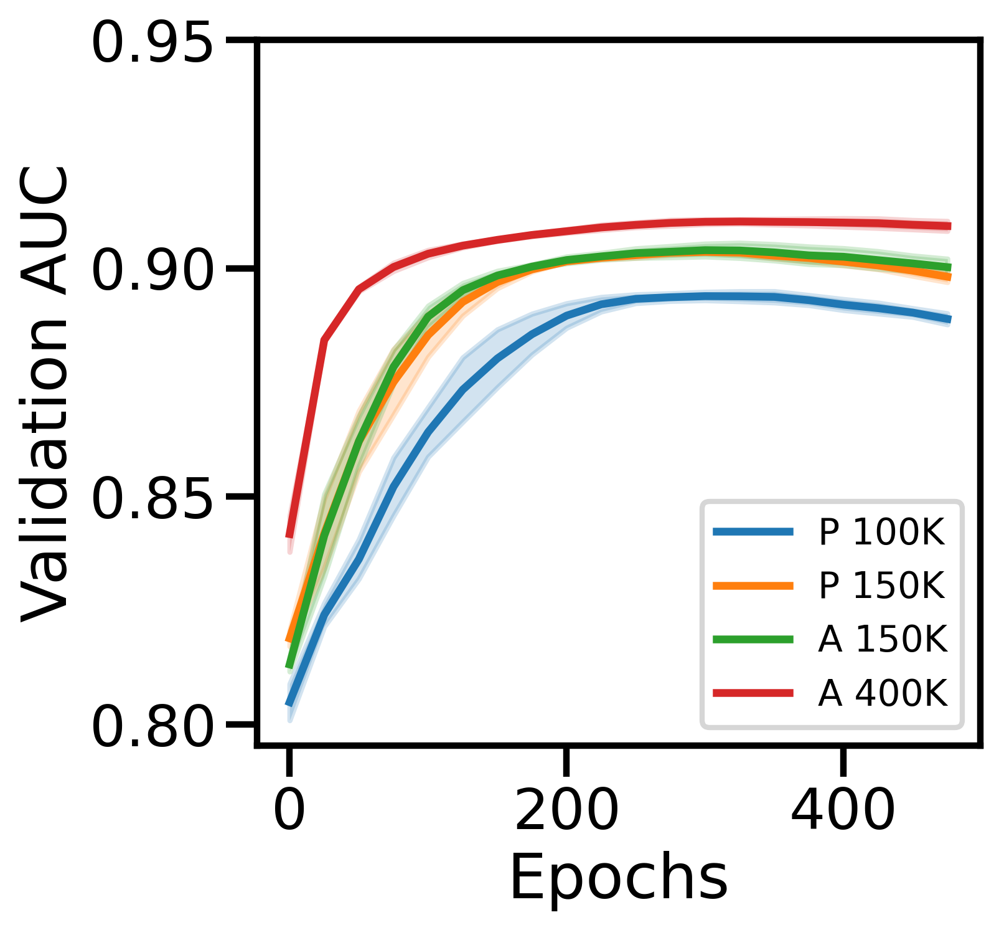

In [25]:
fig, ax = plt.subplots(figsize=(5, 5))
ax = sns.lineplot(data=data, x='epochs', y='val_deltaE', hue='method', ax=ax, ci='sd')
plt.setp(ax.get_legend().get_texts(), fontsize=14)
plt.setp(ax.get_legend().get_title(), fontsize=14)
ax.set_ylabel(r'Validation $\Delta E_{00}$')
ax.set_xlabel('Epochs')
ax.legend(['P 100K', 'P 150K', 'A 150K', 'A 400K'], loc='upper right', fontsize=14)

fig, ax = plt.subplots(figsize=(5, 5))
ax = sns.lineplot(data=data, x='epochs', y='val_auc', hue='method', ax=ax, ci='sd')
plt.setp(ax.get_legend().get_texts(), fontsize=14)
plt.setp(ax.get_legend().get_title(), fontsize=14)
ax.set_ylabel('Validation AUC')
ax.set_xlabel('Epochs')
ax.set_yticks([0.8, 0.85, 0.9, 0.95])
ax.legend(['P 100K', 'P 150K', 'A 150K', 'A 400K'], loc='lower right', fontsize=14)
